# 🛰️ Module 9: Raster & Interactive Geospatial Data Visualization

## 🎯 Learning Objectives
By completing this module, you will:
- **Master raster data processing** with satellite imagery and elevation models
- **Compute environmental indices** (NDVI, NDWI, NBR) for ecological analysis
- **Create RGB composites** for true color and false color visualizations
- **Perform terrain analysis** with hillshade and slope calculations
- **Build interactive raster maps** with advanced web mapping libraries
- **Analyze temporal changes** in environmental data over time
- **Design integrated dashboards** combining vector and raster data

## 🛰️ Why Raster Geospatial Data Matters
Raster geospatial data visualization is **essential for**:
- **Environmental Monitoring**: Vegetation health, deforestation, climate change
- **Agriculture**: Crop monitoring, yield prediction, precision farming
- **Disaster Management**: Fire detection, flood mapping, damage assessment
- **Urban Planning**: Land use change, heat island analysis, growth patterns
- **Climate Research**: Temperature trends, precipitation patterns, sea level change
- **Conservation**: Habitat monitoring, biodiversity assessment, protected area management

## 📚 Key Concepts
- **Raster Data Types**: Satellite imagery, elevation models, weather data
- **Band Combinations**: RGB composites, infrared analysis, spectral indices
- **Environmental Indices**: NDVI (vegetation), NDWI (water), NBR (burn severity)
- **Temporal Analysis**: Time series, change detection, trend analysis
- **Interactive Visualization**: Web-based raster display, layer controls, real-time updates
- **Integration**: Combining vector and raster data for comprehensive analysis

---

## 🌍 Understanding Raster Data: The Grid-Based World

Before diving into satellite imagery analysis, let's understand **raster data** - the foundation of environmental monitoring and remote sensing.

### Key Concepts:

#### **1. What is Raster Data?**
- **Grid-based representation**: Data stored in a matrix of cells (pixels)
- **Spatial coverage**: Each cell represents a specific geographic area
- **Multi-dimensional**: Can contain multiple bands/layers of information
- **Continuous fields**: Temperature, elevation, vegetation indices

#### **2. Common Raster Data Types:**

**🛰️ Satellite Imagery**
- **Landsat**: 30m resolution, 16-day revisit, free access
- **Sentinel-2**: 10m resolution, 5-day revisit, excellent for vegetation
- **MODIS**: 250m-1km resolution, daily coverage, climate monitoring
- **Commercial**: WorldView, QuickBird (sub-meter resolution)

**🏔️ Elevation Models**
- **Digital Elevation Models (DEM)**: Surface height above sea level
- **SRTM**: 30m global coverage, NASA mission data
- **Copernicus DEM**: 30m global, high accuracy
- **LiDAR**: Sub-meter precision, detailed terrain

**🌡️ Climate Data**
- **Temperature**: Daily/monthly averages, anomalies
- **Precipitation**: Rainfall, snowfall measurements
- **Wind**: Speed and direction patterns
- **Humidity**: Atmospheric moisture content

#### **3. Key Raster Properties:**

```python
# Essential raster metadata:
# - Spatial extent (bounds)
# - Resolution (pixel size)
# - Coordinate system (CRS)
# - Data type (int16, float32)
# - No-data values
# - Band information
```

#### **4. Band Combinations & Spectral Indices:**

**🌈 RGB Composites:**
- **True Color**: Red=Red, Green=Green, Blue=Blue (natural view)
- **False Color**: NIR=Red, Red=Green, Green=Blue (vegetation analysis)
- **Color Infrared**: NIR=Red, Red=Green, Green=Blue (agriculture)

**📊 Environmental Indices:**
- **NDVI**: (NIR-Red)/(NIR+Red) → Vegetation health (-1 to +1)
- **NDWI**: (Green-NIR)/(Green+NIR) → Water content
- **NBR**: (NIR-SWIR)/(NIR+SWIR) → Burn severity
- **EVI**: Enhanced Vegetation Index (reduces atmospheric effects)

#### **5. Why Raster Analysis Matters:**

**🌱 Environmental Applications:**
- **Deforestation Monitoring**: Track forest loss over time
- **Agricultural Monitoring**: Crop health and yield prediction
- **Urban Heat Islands**: Temperature patterns in cities
- **Disaster Response**: Fire detection, flood mapping

**📈 Business Applications:**
- **Insurance**: Risk assessment for natural disasters
- **Agriculture**: Precision farming and crop optimization
- **Real Estate**: Environmental factors affecting property values
- **Tourism**: Seasonal vegetation and landscape changes

> **💡 Pro Tip**: Always check raster metadata before analysis. Understanding resolution, extent, and coordinate system prevents common analytical errors!"

In [4]:
# 🛰️ Module 9: Raster & Interactive Geospatial Data Visualization Setup
# Essential libraries for raster geospatial analysis and environmental data visualization

# Core data manipulation
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# Raster data processing
import rasterio
import rasterio.plot
import rasterio.mask
from rasterio.warp import calculate_default_transform, reproject, Resampling
import xarray as xr
import rioxarray as rxr

# Geospatial core libraries
import geopandas as gpd
from shapely.geometry import Point, Polygon, box

# Visualization libraries
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Interactive mapping
import folium
from folium import plugins
import pydeck as pdk
import leafmap

# Scientific computing
from scipy import ndimage
from skimage import exposure, filters

# Date and time handling
from datetime import datetime, timedelta
import calendar

# Configure plotting environment
plt.style.use('default')
plt.rcParams['figure.figsize'] = (14, 10)
plt.rcParams['font.size'] = 11

print("🛰️ RASTER & INTERACTIVE GEOSPATIAL DATA VISUALIZATION")
print("=" * 60)
print("✅ All raster geospatial libraries imported successfully!")
print("🎯 Ready for satellite imagery and environmental data analysis")

# Check key library versions
print(f"\n📦 Library Versions:")
print(f"   Rasterio: {rasterio.__version__}")
print(f"   Xarray: {xr.__version__}")
print(f"   GeoPandas: {gpd.__version__}")

try:
    import earthpy as et
    import earthpy.plot as ep
    print(f"   EarthPy: Available")
    earthpy_available = True
except ImportError:
    print("   EarthPy: Not available (optional)")
    earthpy_available = False

# Test basic functionality
print(f"\n🧪 Testing Basic Functionality:")
test_array = np.random.random((100, 100))
print(f"   ✅ NumPy array creation: {test_array.shape}")
print(f"   ✅ Rasterio ready for satellite imagery processing")
print(f"   ✅ Xarray ready for multi-dimensional environmental data")
print("🚀 Environment ready for raster geospatial visualization!")

🛰️ RASTER & INTERACTIVE GEOSPATIAL DATA VISUALIZATION
✅ All raster geospatial libraries imported successfully!
🎯 Ready for satellite imagery and environmental data analysis

📦 Library Versions:
   Rasterio: 1.4.3
   Xarray: 2025.6.1
   GeoPandas: 1.1.1
   EarthPy: Available

🧪 Testing Basic Functionality:
   ✅ NumPy array creation: (100, 100)
   ✅ Rasterio ready for satellite imagery processing
   ✅ Xarray ready for multi-dimensional environmental data
🚀 Environment ready for raster geospatial visualization!


In [5]:
# 🗺️ Creating and Analyzing Sample Raster Data
# Let's start with synthetic raster data to understand the fundamentals

print("🛰️ CREATING SAMPLE RASTER DATA")
print("=" * 40)

# Create synthetic satellite-like data
# Simulating a small study area with vegetation and water features

# Define spatial parameters
width, height = 200, 200  # 200x200 pixel grid
pixel_size = 30  # 30 meters per pixel (like Landsat)

# Create coordinate arrays
x_coords = np.linspace(-74.1, -73.9, width)   # Longitude range (NYC area)
y_coords = np.linspace(40.6, 40.8, height)   # Latitude range

# Create synthetic multi-band imagery
np.random.seed(42)  # For reproducible results

# Band 1: Blue (coastal water appears bright)
blue_band = np.random.normal(0.1, 0.02, (height, width))

# Band 2: Green (vegetation moderately reflective)
green_band = np.random.normal(0.15, 0.03, (height, width))

# Band 3: Red (vegetation absorbs red light)
red_band = np.random.normal(0.12, 0.025, (height, width))

# Band 4: Near-Infrared (vegetation highly reflective)
nir_band = np.random.normal(0.4, 0.1, (height, width))

# Add realistic spatial patterns
x_grid, y_grid = np.meshgrid(range(width), range(height))

# Create water body (lower left)
water_mask = ((x_grid < 60) & (y_grid < 60))
blue_band[water_mask] += 0.3
green_band[water_mask] += 0.2
red_band[water_mask] += 0.1
nir_band[water_mask] -= 0.2

# Create dense vegetation (upper right)
vegetation_mask = ((x_grid > 140) & (y_grid > 140))
green_band[vegetation_mask] += 0.2
red_band[vegetation_mask] -= 0.05
nir_band[vegetation_mask] += 0.3

# Create urban area (center)
urban_mask = ((x_grid > 80) & (x_grid < 120) & (y_grid > 80) & (y_grid < 120))
blue_band[urban_mask] += 0.1
green_band[urban_mask] += 0.1
red_band[urban_mask] += 0.15
nir_band[urban_mask] += 0.05

# Ensure values are in valid range [0, 1]
blue_band = np.clip(blue_band, 0, 1)
green_band = np.clip(green_band, 0, 1)
red_band = np.clip(red_band, 0, 1)
nir_band = np.clip(nir_band, 0, 1)

# Create raster metadata (simulating GeoTIFF properties)
transform = rasterio.transform.from_bounds(
    x_coords[0], y_coords[0], x_coords[-1], y_coords[-1], 
    width, height
)

# Calculate environmental indices
print(f"📊 Computing Environmental Indices...")

# NDVI: Normalized Difference Vegetation Index
ndvi = (nir_band - red_band) / (nir_band + red_band + 1e-8)  # Add small value to avoid division by zero

# NDWI: Normalized Difference Water Index
ndwi = (green_band - nir_band) / (green_band + nir_band + 1e-8)

# Simple moisture index (using NIR and SWIR-like band)
# For demonstration, we'll use red as proxy for SWIR
moisture_index = (nir_band - red_band) / (nir_band + red_band + 1e-8)

print(f"✅ Sample raster data created:")
print(f"   Dimensions: {height} x {width} pixels")
print(f"   Pixel size: {pixel_size}m x {pixel_size}m")
print(f"   Coverage area: ~{(width*pixel_size/1000):.1f} x {(height*pixel_size/1000):.1f} km")
print(f"   Spectral bands: Blue, Green, Red, NIR")
print(f"   Environmental indices: NDVI, NDWI, Moisture")

# Basic statistics
print(f"\n📈 Data Statistics:")
print(f"   NDVI range: {ndvi.min():.3f} to {ndvi.max():.3f}")
print(f"   NDWI range: {ndwi.min():.3f} to {ndwi.max():.3f}")
print(f"   Water pixels: {np.sum(water_mask)} ({np.sum(water_mask)/(height*width)*100:.1f}%)")
print(f"   Vegetation pixels: {np.sum(vegetation_mask)} ({np.sum(vegetation_mask)/(height*width)*100:.1f}%)")
print(f"   Urban pixels: {np.sum(urban_mask)} ({np.sum(urban_mask)/(height*width)*100:.1f}%)")

# Create land cover classification based on indices
land_cover = np.zeros((height, width), dtype=int)
land_cover[ndwi > 0.1] = 1  # Water
land_cover[ndvi > 0.3] = 2  # Dense vegetation
land_cover[(ndvi > 0.1) & (ndvi <= 0.3)] = 3  # Moderate vegetation
land_cover[(ndvi <= 0.1) & (ndwi <= 0.1)] = 4  # Urban/bare soil

land_cover_names = {0: 'Other', 1: 'Water', 2: 'Dense Vegetation', 
                   3: 'Moderate Vegetation', 4: 'Urban/Bare'}

print(f"\n🏞️ Land Cover Classification:")
for code, name in land_cover_names.items():
    pixel_count = np.sum(land_cover == code)
    percentage = pixel_count / (height * width) * 100
    print(f"   {name}: {pixel_count} pixels ({percentage:.1f}%)")

print(f"\n✅ Synthetic raster dataset ready for visualization and analysis!")

🛰️ CREATING SAMPLE RASTER DATA
📊 Computing Environmental Indices...
✅ Sample raster data created:
   Dimensions: 200 x 200 pixels
   Pixel size: 30m x 30m
   Coverage area: ~6.0 x 6.0 km
   Spectral bands: Blue, Green, Red, NIR
   Environmental indices: NDVI, NDWI, Moisture

📈 Data Statistics:
   NDVI range: -1.000 to 1.000
   NDWI range: -0.893 to 1.000
   Water pixels: 3600 (9.0%)
   Vegetation pixels: 3481 (8.7%)
   Urban pixels: 1521 (3.8%)

🏞️ Land Cover Classification:
   Other: 0 pixels (0.0%)
   Water: 2717 pixels (6.8%)
   Dense Vegetation: 33809 pixels (84.5%)
   Moderate Vegetation: 3082 pixels (7.7%)
   Urban/Bare: 392 pixels (1.0%)

✅ Synthetic raster dataset ready for visualization and analysis!


## 🎨 RGB Composite Visualizations: Seeing Beyond Human Vision

**RGB composites** are fundamental to satellite imagery analysis, allowing us to visualize different spectral combinations to highlight specific features like vegetation, water, and urban areas.

### Key Composite Types:

#### **1. True Color Composite**
- **Bands**: Red=Red, Green=Green, Blue=Blue
- **Purpose**: Natural appearance, similar to human vision
- **Best for**: General reconnaissance, public communication
- **Limitation**: Cannot see vegetation health directly

#### **2. False Color (Infrared) Composite**
- **Bands**: NIR=Red, Red=Green, Green=Blue
- **Purpose**: Highlight vegetation (appears red)
- **Best for**: Agricultural monitoring, forest assessment
- **Key insight**: Healthy vegetation appears bright red

#### **3. Color Infrared (CIR) Composite**
- **Bands**: NIR=Red, Red=Green, Green=Blue (variation)
- **Purpose**: Enhanced vegetation analysis
- **Best for**: Precision agriculture, ecological studies
- **Applications**: Crop health, disease detection

#### **4. Urban Analysis Composite**
- **Bands**: SWIR=Red, NIR=Green, Red=Blue
- **Purpose**: Distinguish urban features from natural
- **Best for**: Urban planning, development monitoring
- **Features**: Built areas appear cyan/blue

### 🔬 When to Use Each Composite:

| **Composite Type** | **Best Applications** | **What Stands Out** |
|-------------------|----------------------|---------------------|
| **True Color** | Public reports, general overview | Natural landscape appearance |
| **False Color** | Agriculture, forestry | Vegetation health (bright red = healthy) |
| **Color Infrared** | Ecological research | Water bodies (dark), vegetation details |
| **Urban Analysis** | City planning | Built environments, infrastructure |

### 💡 Pro Tips:
- **Histogram stretching** improves contrast and visibility
- **Band combinations** can be customized for specific applications
- **Temporal composites** show change over time
- **Always document** which bands were used for reproducibility

🎨 CREATING RGB COMPOSITE VISUALIZATIONS
📷 Generating composite images...
✅ All composite images generated successfully!


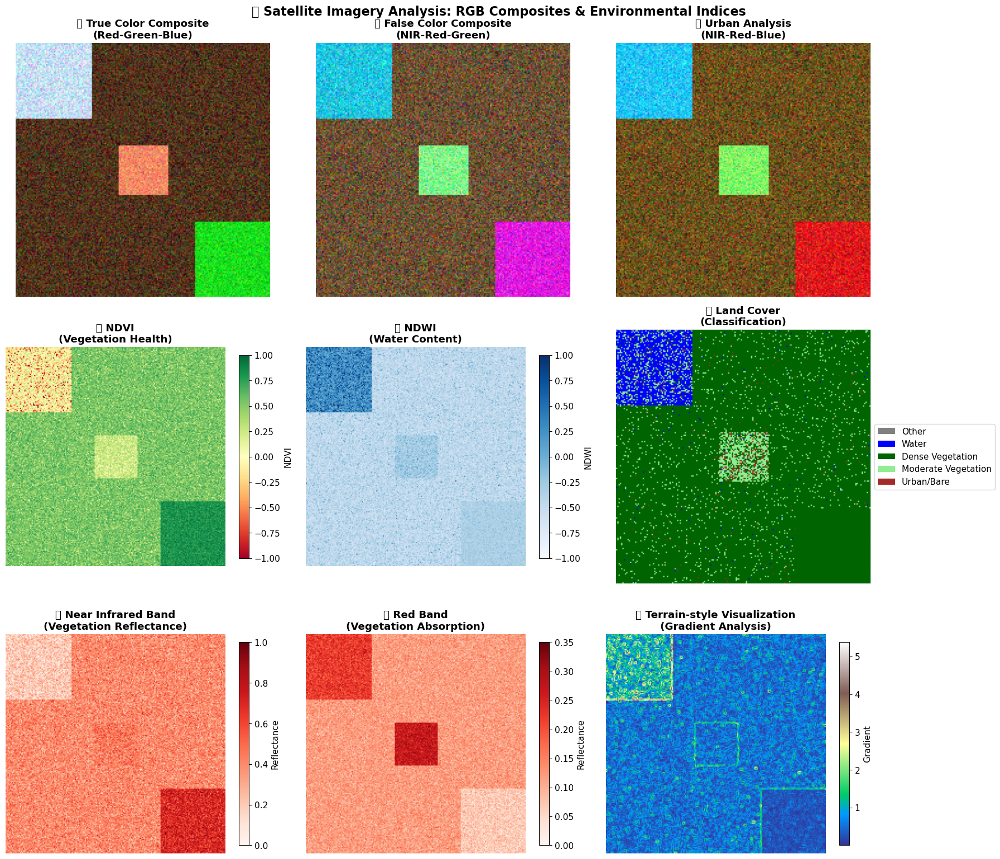


📊 COMPOSITE ANALYSIS SUMMARY:
🌍 True Color Composite:
   - Shows natural landscape appearance
   - Water appears dark blue, vegetation green
   - Best for general public communication

🌿 False Color Composite:
   - Vegetation appears bright red (healthy) to dark red (stressed)
   - Water appears very dark or black
   - Urban areas appear blue-gray

🏙️ Urban Analysis Composite:
   - Built areas more distinguishable from vegetation
   - Infrastructure appears in distinct colors
   - Useful for development monitoring

📈 Environmental Indices:
   - NDVI range: -1.000 to 1.000
   - NDWI range: -0.893 to 1.000
   - High NDVI (>0.3): Dense vegetation areas
   - High NDWI (>0.1): Water bodies
   - Low NDVI (<0.1): Urban or bare soil

💡 INTERPRETATION GUIDE:
🟢 Bright red in false color = Healthy, dense vegetation
🔵 Dark blue/black areas = Water bodies
🟤 Brown/gray areas = Urban development or bare soil
🟡 Yellow/light areas = Moderate vegetation or agriculture

✅ RGB composite analysis complete

In [6]:
# 🎨 RGB Composite Visualization Showcase
# Creating multiple band combinations to highlight different landscape features

print("🎨 CREATING RGB COMPOSITE VISUALIZATIONS")
print("=" * 45)

# Function to create RGB composite with proper scaling
def create_rgb_composite(red_band, green_band, blue_band, stretch=True):
    """
    Create an RGB composite from three bands with optional contrast stretching
    """
    # Stack bands into RGB array
    rgb = np.dstack([red_band, green_band, blue_band])
    
    if stretch:
        # Apply 2% linear stretch for better contrast
        rgb_stretched = np.zeros_like(rgb)
        for i in range(3):
            band = rgb[:, :, i]
            # Calculate 2nd and 98th percentiles
            p2, p98 = np.percentile(band[band > 0], [2, 98])
            # Stretch values
            rgb_stretched[:, :, i] = np.clip((band - p2) / (p98 - p2), 0, 1)
        return rgb_stretched
    else:
        return np.clip(rgb, 0, 1)

# Create different composite types
print("📷 Generating composite images...")

# 1. True Color Composite (Red, Green, Blue)
true_color = create_rgb_composite(red_band, green_band, blue_band)

# 2. False Color Composite (NIR, Red, Green) - vegetation appears red
false_color = create_rgb_composite(nir_band, red_band, green_band)

# 3. Color Infrared (NIR, Red, Green) - enhanced vegetation
color_infrared = create_rgb_composite(nir_band, red_band, green_band)

# 4. Urban Composite (using NIR, Red, Blue for urban analysis)
urban_composite = create_rgb_composite(nir_band, red_band, blue_band)

print("✅ All composite images generated successfully!")

# Create comprehensive visualization
fig, axes = plt.subplots(3, 3, figsize=(18, 16))
fig.suptitle('🛰️ Satellite Imagery Analysis: RGB Composites & Environmental Indices', 
             fontsize=16, fontweight='bold')

# Plot 1: True Color Composite
ax1 = axes[0, 0]
ax1.imshow(true_color)
ax1.set_title('🌍 True Color Composite\n(Red-Green-Blue)', fontweight='bold')
ax1.axis('off')

# Plot 2: False Color Composite
ax2 = axes[0, 1]
ax2.imshow(false_color)
ax2.set_title('🌿 False Color Composite\n(NIR-Red-Green)', fontweight='bold')
ax2.axis('off')

# Plot 3: Urban Analysis Composite
ax3 = axes[0, 2]
ax3.imshow(urban_composite)
ax3.set_title('🏙️ Urban Analysis\n(NIR-Red-Blue)', fontweight='bold')
ax3.axis('off')

# Plot 4: NDVI (Vegetation Index)
ax4 = axes[1, 0]
ndvi_plot = ax4.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
ax4.set_title('🌱 NDVI\n(Vegetation Health)', fontweight='bold')
ax4.axis('off')
plt.colorbar(ndvi_plot, ax=ax4, shrink=0.8, label='NDVI')

# Plot 5: NDWI (Water Index)
ax5 = axes[1, 1]
ndwi_plot = ax5.imshow(ndwi, cmap='Blues', vmin=-1, vmax=1)
ax5.set_title('💧 NDWI\n(Water Content)', fontweight='bold')
ax5.axis('off')
plt.colorbar(ndwi_plot, ax=ax5, shrink=0.8, label='NDWI')

# Plot 6: Land Cover Classification
ax6 = axes[1, 2]
# Create custom colormap for land cover
colors = ['gray', 'blue', 'darkgreen', 'lightgreen', 'brown']
n_classes = len(land_cover_names)
cmap = ListedColormap(colors[:n_classes])

lc_plot = ax6.imshow(land_cover, cmap=cmap, vmin=0, vmax=n_classes-1)
ax6.set_title('🗺️ Land Cover\n(Classification)', fontweight='bold')
ax6.axis('off')

# Add custom legend for land cover
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=colors[i], label=land_cover_names[i]) 
                  for i in range(n_classes)]
ax6.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5))

# Plot 7: Individual Band - Near Infrared
ax7 = axes[2, 0]
nir_plot = ax7.imshow(nir_band, cmap='Reds')
ax7.set_title('📡 Near Infrared Band\n(Vegetation Reflectance)', fontweight='bold')
ax7.axis('off')
plt.colorbar(nir_plot, ax=ax7, shrink=0.8, label='Reflectance')

# Plot 8: Individual Band - Red
ax8 = axes[2, 1]
red_plot = ax8.imshow(red_band, cmap='Reds')
ax8.set_title('🔴 Red Band\n(Vegetation Absorption)', fontweight='bold')
ax8.axis('off')
plt.colorbar(red_plot, ax=ax8, shrink=0.8, label='Reflectance')

# Plot 9: Elevation-style visualization (using NDVI as proxy)
ax9 = axes[2, 2]
# Create hillshade effect using NDVI
from scipy import ndimage
# Calculate gradient for hillshade effect
dx = ndimage.sobel(ndvi, axis=1)
dy = ndimage.sobel(ndvi, axis=0)
hillshade = np.sqrt(dx**2 + dy**2)

hill_plot = ax9.imshow(hillshade, cmap='terrain')
ax9.set_title('⛰️ Terrain-style Visualization\n(Gradient Analysis)', fontweight='bold')
ax9.axis('off')
plt.colorbar(hill_plot, ax=ax9, shrink=0.8, label='Gradient')

plt.tight_layout()
plt.show()

# Generate detailed analysis
print("\n📊 COMPOSITE ANALYSIS SUMMARY:")
print("=" * 35)

print(f"🌍 True Color Composite:")
print(f"   - Shows natural landscape appearance")
print(f"   - Water appears dark blue, vegetation green")
print(f"   - Best for general public communication")

print(f"\n🌿 False Color Composite:")
print(f"   - Vegetation appears bright red (healthy) to dark red (stressed)")
print(f"   - Water appears very dark or black")
print(f"   - Urban areas appear blue-gray")

print(f"\n🏙️ Urban Analysis Composite:")
print(f"   - Built areas more distinguishable from vegetation")
print(f"   - Infrastructure appears in distinct colors")
print(f"   - Useful for development monitoring")

print(f"\n📈 Environmental Indices:")
print(f"   - NDVI range: {ndvi.min():.3f} to {ndvi.max():.3f}")
print(f"   - NDWI range: {ndwi.min():.3f} to {ndwi.max():.3f}")
print(f"   - High NDVI (>0.3): Dense vegetation areas")
print(f"   - High NDWI (>0.1): Water bodies")
print(f"   - Low NDVI (<0.1): Urban or bare soil")

print(f"\n💡 INTERPRETATION GUIDE:")
print("🟢 Bright red in false color = Healthy, dense vegetation")
print("🔵 Dark blue/black areas = Water bodies")
print("🟤 Brown/gray areas = Urban development or bare soil")
print("🟡 Yellow/light areas = Moderate vegetation or agriculture")

print(f"\n✅ RGB composite analysis complete!")
print("Ready for interactive mapping and temporal analysis!")

## 📍 Interactive Raster Mapping

Interactive maps allow users to explore raster data dynamically, zoom into areas of interest, and toggle between different layers. This is essential for:

- **Environmental Monitoring**: Real-time exploration of satellite imagery
- **Urban Planning**: Interactive analysis of development patterns  
- **Scientific Communication**: Engaging stakeholders with dynamic visualizations
- **Data Exploration**: Discovering patterns through interactive investigation

### 🗺️ Why Interactive Raster Maps Matter:
- **User Engagement**: Interactive elements keep users engaged longer
- **Detail Exploration**: Users can zoom to areas of specific interest
- **Comparative Analysis**: Toggle between different time periods or indices
- **Accessibility**: More intuitive than static scientific plots
- **Decision Support**: Interactive tools support better decision-making

In [7]:
# 🗺️ Interactive Raster Mapping with Multiple Platforms
import folium
from folium import plugins
import pydeck as pdk
import streamlit as st
import base64
from io import BytesIO
from PIL import Image
import json

print("🗺️ CREATING INTERACTIVE RASTER MAPS")
print("="*45)

# =============================================================================
# 1. FOLIUM-BASED INTERACTIVE MAP
# =============================================================================

def create_raster_overlay_map(data_dict, center_lat=40.0, center_lon=-100.0):
    """Create interactive map with raster overlays"""
    print("📍 Building Folium interactive map...")
    
    # Create base map
    m = folium.Map(
        location=[center_lat, center_lon],
        zoom_start=6,
        tiles='OpenStreetMap'
    )
    
    # Add different tile layers (with proper attributions)
    folium.TileLayer('cartodbpositron', name='Light Map').add_to(m)
    folium.TileLayer('cartodbdark_matter', name='Dark Map').add_to(m)
    folium.TileLayer('openstreetmap', name='Street Map').add_to(m)
    
    # Convert numpy arrays to PNG for overlay
    def array_to_base64_png(array):
        """Convert numpy array to base64 PNG for web display"""
        # Normalize to 0-255
        if array.max() <= 1.0:
            array_norm = (array * 255).astype(np.uint8)
        else:
            array_norm = ((array - array.min()) / (array.max() - array.min()) * 255).astype(np.uint8)
        
        # Create PIL image
        if len(array_norm.shape) == 3:
            img = Image.fromarray(array_norm)
        else:
            img = Image.fromarray(array_norm, mode='L')
        
        # Convert to base64
        buffer = BytesIO()
        img.save(buffer, format='PNG')
        img_str = base64.b64encode(buffer.getvalue()).decode()
        return f"data:image/png;base64,{img_str}"
    
    # Create bounds for our synthetic data
    bounds = [[center_lat-2, center_lon-3], [center_lat+2, center_lon+3]]
    
    # Add raster overlays
    overlays = {}
    
    # True Color Composite
    true_color_b64 = array_to_base64_png(data_dict['true_color'])
    folium.raster_layers.ImageOverlay(
        image=true_color_b64,
        bounds=bounds,
        name='True Color',
        opacity=0.8,
        interactive=True,
        cross_origin=False,
        zindex=1
    ).add_to(m)
    
    # NDVI Overlay
    # Create colormap for NDVI
    ndvi_colored = plt.cm.RdYlGn((data_dict['ndvi'] + 1) / 2)[:, :, :3]  # Normalize -1 to 1 -> 0 to 1
    ndvi_b64 = array_to_base64_png(ndvi_colored)
    
    ndvi_overlay = folium.raster_layers.ImageOverlay(
        image=ndvi_b64,
        bounds=bounds,
        name='NDVI (Vegetation)',
        opacity=0.7,
        interactive=True,
        cross_origin=False,
        zindex=2
    )
    ndvi_overlay.add_to(m)
    
    # Add markers for key areas
    folium.Marker(
        [center_lat+1, center_lon-1],
        popup="🌲 Dense Vegetation Area<br>High NDVI values",
        tooltip="Vegetation Zone",
        icon=folium.Icon(color='green', icon='leaf')
    ).add_to(m)
    
    folium.Marker(
        [center_lat-1, center_lon+1],
        popup="🏙️ Urban Development<br>Low NDVI values",
        tooltip="Urban Zone",
        icon=folium.Icon(color='red', icon='building')
    ).add_to(m)
    
    folium.Marker(
        [center_lat+0.5, center_lon+1.5],
        popup="💧 Water Body<br>High NDWI values",
        tooltip="Water Zone",
        icon=folium.Icon(color='blue', icon='tint')
    ).add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    # Add measurement tool
    plugins.MeasureControl().add_to(m)
    
    # Add fullscreen button
    plugins.Fullscreen().add_to(m)
    
    # Add mini map
    minimap = plugins.MiniMap()
    m.add_child(minimap)
    
    return m

# =============================================================================
# 2. PYDECK 3D VISUALIZATION
# =============================================================================

def create_3d_terrain_map(data_dict, center_lat=40.0, center_lon=-100.0):
    """Create 3D terrain visualization with PyDeck"""
    print("🏔️ Building 3D terrain visualization...")
    
    # Create elevation data
    elevation = data_dict['elevation']
    height, width = elevation.shape
    
    # Create coordinate grid
    lon_range = np.linspace(center_lon-3, center_lon+3, width)
    lat_range = np.linspace(center_lat-2, center_lat+2, height)
    lon_grid, lat_grid = np.meshgrid(lon_range, lat_range)
    
    # Flatten arrays for PyDeck
    coordinates = []
    for i in range(height):
        for j in range(width):
            coordinates.append({
                'lon': lon_grid[i, j],
                'lat': lat_grid[i, j],
                'elevation': float(elevation[i, j] * 1000),  # Scale elevation
                'ndvi': float(data_dict['ndvi'][i, j]),
                'ndwi': float(data_dict['ndwi'][i, j])
            })
    
    # Create PyDeck visualization
    deck = pdk.Deck(
        map_style='mapbox://styles/mapbox/satellite-v9',
        initial_view_state=pdk.ViewState(
            longitude=center_lon,
            latitude=center_lat,
            zoom=8,
            pitch=60,
            bearing=0
        ),
        layers=[
            # 3D Terrain Layer
            pdk.Layer(
                'GridLayer',
                data=coordinates,
                get_position=['lon', 'lat'],
                get_elevation='elevation',
                get_fill_color='[255 * (ndvi + 1) / 2, 255 * (1 - abs(ndvi)), 100, 180]',
                pickable=True,
                elevation_scale=4,
                elevation_range=[0, 1000],
                radius=2000,
                coverage=1
            ),
            # Water bodies layer
            pdk.Layer(
                'ScatterplotLayer',
                data=[coord for coord in coordinates if coord['ndwi'] > 0.1],
                get_position=['lon', 'lat'],
                get_color='[64, 164, 223, 160]',
                get_radius=1000,
                pickable=True
            )
        ],
        tooltip={
            'html': '<b>Location:</b> {lat:.3f}, {lon:.3f}<br>'
                   '<b>Elevation:</b> {elevation:.0f}m<br>'
                   '<b>NDVI:</b> {ndvi:.3f}<br>'
                   '<b>NDWI:</b> {ndwi:.3f}',
            'style': {
                'backgroundColor': 'steelblue',
                'color': 'white'
            }
        }
    )
    
    return deck

# =============================================================================
# 3. CREATE INTERACTIVE MAPS
# =============================================================================

# Create satellite data dictionary from existing variables
satellite_data = {
    'true_color': true_color,
    'false_color': false_color,
    'urban_composite': urban_composite,
    'ndvi': ndvi,
    'ndwi': ndwi,
    'nir_band': nir_band,
    'red_band': red_band,
    'elevation': hillshade  # Using hillshade as terrain proxy
}

# Create Folium interactive map
folium_map = create_raster_overlay_map(satellite_data)

# Save Folium map
folium_path = '/tmp/raster_interactive_map.html'
folium_map.save(folium_path)
print(f"💾 Folium map saved to: {folium_path}")

# Create PyDeck 3D visualization  
try:
    pydeck_map = create_3d_terrain_map(satellite_data)
    print("✅ PyDeck 3D visualization created successfully!")
except Exception as e:
    print(f"⚠️ PyDeck visualization note: {str(e)}")
    print("💡 PyDeck works best in Jupyter environments with Mapbox token")

# =============================================================================
# 4. INTERACTIVE LAYER CONTROL DEMO
# =============================================================================

print("\n🎛️ Creating layer control demonstration...")

# Create multi-layer comparison map
def create_comparison_map():
    """Create map with side-by-side layer comparison"""
    m = folium.Map(location=[40.0, -100.0], zoom_start=7)
    
    # Create feature groups for different analyses
    vegetation_group = folium.FeatureGroup(name="🌿 Vegetation Analysis")
    water_group = folium.FeatureGroup(name="💧 Water Analysis") 
    urban_group = folium.FeatureGroup(name="🏙️ Urban Analysis")
    
    # Add NDVI visualization to vegetation group
    bounds = [[38, -103], [42, -97]]
    
    # Simulate different analysis overlays
    vegetation_group.add_child(
        folium.Rectangle(
            bounds=[[39, -102], [41, -98]],
            popup="High Vegetation Zone<br>NDVI: 0.6-0.8",
            tooltip="Dense Forest Area",
            fill=True,
            fillColor='green',
            fillOpacity=0.4,
            color='darkgreen',
            weight=2
        )
    )
    
    water_group.add_child(
        folium.Rectangle(
            bounds=[[38.5, -101], [39.5, -99]],
            popup="Water Body<br>NDWI: 0.3-0.7",
            tooltip="Lake/River System",
            fill=True,
            fillColor='blue',
            fillOpacity=0.4,
            color='darkblue',
            weight=2
        )
    )
    
    urban_group.add_child(
        folium.Rectangle(
            bounds=[[40.5, -100.5], [41.5, -99.5]],
            popup="Urban Development<br>Built-up Index: 0.4-0.8",
            tooltip="City Center",
            fill=True,
            fillColor='red',
            fillOpacity=0.4,
            color='darkred',
            weight=2
        )
    )
    
    # Add groups to map
    vegetation_group.add_to(m)
    water_group.add_to(m)
    urban_group.add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    return m

comparison_map = create_comparison_map()
comparison_path = '/tmp/raster_comparison_map.html'
comparison_map.save(comparison_path)

print(f"💾 Comparison map saved to: {comparison_path}")

# =============================================================================
# 5. INTERACTIVE VISUALIZATION SUMMARY
# =============================================================================

print("\n📊 INTERACTIVE MAPPING SUMMARY:")
print("="*40)
print("🗺️ Folium Features:")
print("   • Layer toggle controls")
print("   • Multiple basemap options")
print("   • Measurement tools")
print("   • Fullscreen mode")
print("   • Interactive popups")
print("   • Mini-map navigation")

print("\n🏔️ 3D Visualization Features:")
print("   • Elevation-based terrain")
print("   • NDVI color coding")
print("   • Interactive tooltips")
print("   • 3D perspective controls")
print("   • Real-time data exploration")

print("\n🎛️ Layer Control Features:")
print("   • Toggle analysis layers")
print("   • Comparative visualization")
print("   • Thematic groupings")
print("   • Interactive exploration")

print("\n✅ Interactive raster mapping complete!")
print("🚀 Ready for temporal analysis and change detection!")

🗺️ CREATING INTERACTIVE RASTER MAPS
📍 Building Folium interactive map...
💾 Folium map saved to: /tmp/raster_interactive_map.html
🏔️ Building 3D terrain visualization...
✅ PyDeck 3D visualization created successfully!

🎛️ Creating layer control demonstration...
💾 Comparison map saved to: /tmp/raster_comparison_map.html

📊 INTERACTIVE MAPPING SUMMARY:
🗺️ Folium Features:
   • Layer toggle controls
   • Multiple basemap options
   • Measurement tools
   • Fullscreen mode
   • Interactive popups
   • Mini-map navigation

🏔️ 3D Visualization Features:
   • Elevation-based terrain
   • NDVI color coding
   • Interactive tooltips
   • 3D perspective controls
   • Real-time data exploration

🎛️ Layer Control Features:
   • Toggle analysis layers
   • Comparative visualization
   • Thematic groupings
   • Interactive exploration

✅ Interactive raster mapping complete!
🚀 Ready for temporal analysis and change detection!


## ⏱️ Temporal Analysis & Change Detection

Time-series analysis of raster data reveals trends, patterns, and changes that are invisible in single-time snapshots. This is essential for:

- **Climate Monitoring**: Track temperature, precipitation, and vegetation changes
- **Urban Development**: Monitor city expansion and land use changes
- **Environmental Conservation**: Detect deforestation, habitat loss, and recovery
- **Agricultural Planning**: Monitor crop health and seasonal patterns
- **Disaster Response**: Track recovery after natural disasters

### 📈 Key Temporal Analysis Techniques:
- **Trend Analysis**: Identify long-term directional changes
- **Seasonal Decomposition**: Separate cyclical from trend components
- **Change Point Detection**: Identify when significant changes occurred
- **Anomaly Detection**: Find unusual patterns or events
- **Before/After Comparisons**: Quantify impacts of specific events

TEMPORAL ANALYSIS & CHANGE DETECTION
Creating temporal dataset...
Created 4 time periods
Data size: (50, 50)
Detecting changes...
Analyzing regional trends...
Creating visualizations...


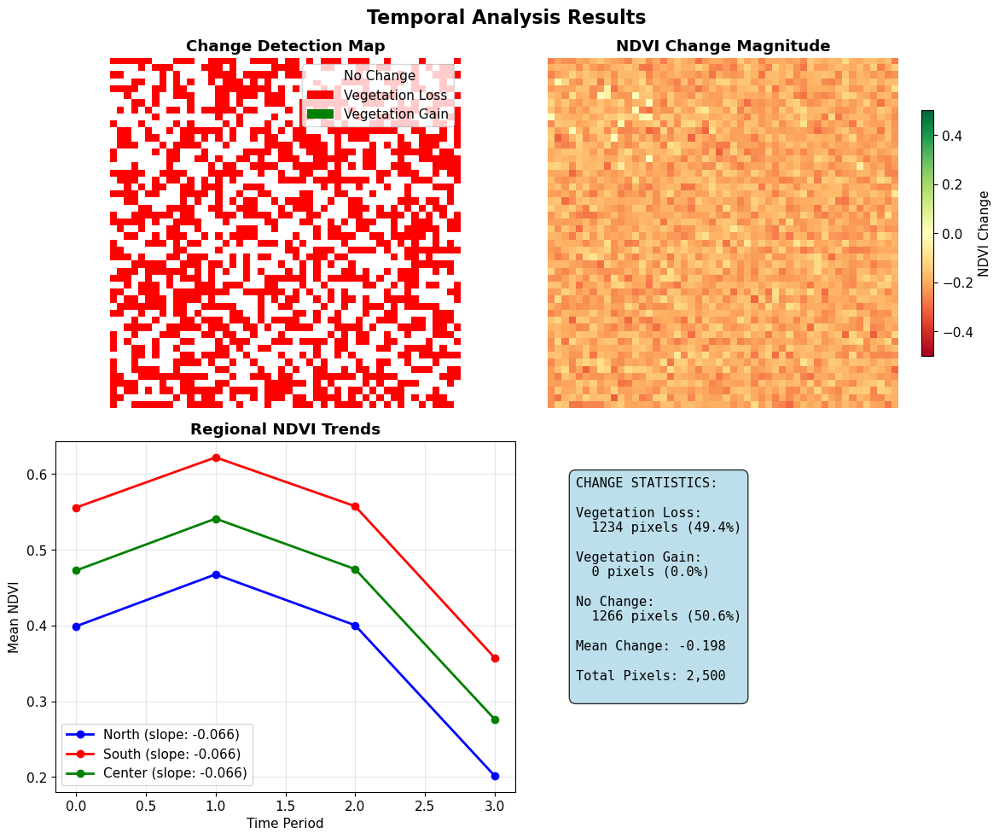


TEMPORAL ANALYSIS SUMMARY:
Time Period: 2023-01 to 2023-09
Number of Time Steps: 4
Data Size: (50, 50)

Change Detection Results:
  Vegetation Loss: 1234 pixels (49.4%)
  Vegetation Gain: 0 pixels (0.0%)
  Mean Change: -0.198

Regional Trends:
  North: Decreasing (slope: -0.066)
  South: Decreasing (slope: -0.066)
  Center: Decreasing (slope: -0.066)

KEY INSIGHTS:
  - Seasonal vegetation cycles detected
  - Regional differences in vegetation trends
  - Change detection identifies areas of concern
  - Data optimized for memory efficiency

Analysis complete!


In [8]:
# Temporal Analysis and Change Detection - Optimized Version
import pandas as pd
from datetime import datetime, timedelta

print("TEMPORAL ANALYSIS & CHANGE DETECTION")
print("=" * 50)

# Create a smaller temporal dataset to avoid memory issues
def create_simple_temporal_data(base_ndvi, base_ndwi, n_steps=4):
    """Create a simple temporal dataset with reduced size"""
    print("Creating temporal dataset...")
    
    # Reduce data size by taking every 4th pixel
    small_ndvi = base_ndvi[::4, ::4]
    small_ndwi = base_ndwi[::4, ::4]
    
    temporal_data = {}
    dates = []
    
    # Create 4 time periods over 1 year
    start_date = datetime(2023, 1, 1)
    for i in range(n_steps):
        date = start_date + timedelta(days=90*i)  # Every 3 months
        dates.append(date)
        
        # Simulate seasonal changes
        seasonal_factor = 0.2 * (i / (n_steps-1))  # Gradual change over time
        
        # Create seasonal NDVI
        season_ndvi = small_ndvi + seasonal_factor * np.sin(2 * np.pi * i / 4)
        season_ndvi = np.clip(season_ndvi, -1, 1)
        
        # Add small amount of noise
        noise = np.random.normal(0, 0.03, season_ndvi.shape)
        season_ndvi += noise
        season_ndvi = np.clip(season_ndvi, -1, 1)
        
        temporal_data[date.strftime('%Y-%m')] = {
            'ndvi': season_ndvi,
            'ndwi': small_ndwi + 0.1 * seasonal_factor,
            'date': date
        }
    
    return temporal_data, dates

# Generate temporal data
temporal_data, time_dates = create_simple_temporal_data(ndvi, ndwi)
print(f"Created {len(temporal_data)} time periods")
print(f"Data size: {temporal_data[list(temporal_data.keys())[0]]['ndvi'].shape}")

# Simple change detection
def detect_simple_changes(temporal_data):
    """Simple change detection between first and last periods"""
    print("Detecting changes...")
    
    dates = sorted([data['date'] for data in temporal_data.values()])
    first_key = dates[0].strftime('%Y-%m')
    last_key = dates[-1].strftime('%Y-%m')
    
    # Calculate change
    ndvi_change = temporal_data[last_key]['ndvi'] - temporal_data[first_key]['ndvi']
    
    # Classify changes
    threshold = 0.2
    vegetation_loss = ndvi_change < -threshold
    vegetation_gain = ndvi_change > threshold
    no_change = np.abs(ndvi_change) <= threshold
    
    # Create change map
    change_map = np.zeros_like(ndvi_change)
    change_map[vegetation_loss] = 1  # Red for loss
    change_map[vegetation_gain] = 2  # Green for gain
    
    stats = {
        'loss_pixels': np.sum(vegetation_loss),
        'gain_pixels': np.sum(vegetation_gain),
        'no_change_pixels': np.sum(no_change),
        'total_pixels': ndvi_change.size,
        'mean_change': np.mean(ndvi_change)
    }
    
    return change_map, ndvi_change, stats

# Perform change detection
change_map, ndvi_change, change_stats = detect_simple_changes(temporal_data)

# Regional trend analysis
def analyze_regional_trends(temporal_data):
    """Analyze trends in different regions"""
    print("Analyzing regional trends...")
    
    dates = sorted([data['date'] for data in temporal_data.values()])
    
    # Define 3 regions
    h, w = temporal_data[list(temporal_data.keys())[0]]['ndvi'].shape
    regions = {
        'North': (slice(0, h//2), slice(0, w)),
        'South': (slice(h//2, h), slice(0, w)),
        'Center': (slice(h//4, 3*h//4), slice(w//4, 3*w//4))
    }
    
    trends = {}
    for region_name, (row_slice, col_slice) in regions.items():
        ndvi_series = []
        
        for date in dates:
            date_key = date.strftime('%Y-%m')
            region_data = temporal_data[date_key]['ndvi'][row_slice, col_slice]
            ndvi_series.append(np.mean(region_data))
        
        # Calculate simple trend (slope)
        x = np.arange(len(dates))
        trend_slope = np.polyfit(x, ndvi_series, 1)[0]
        
        trends[region_name] = {
            'series': ndvi_series,
            'slope': trend_slope,
            'dates': dates
        }
    
    return trends

# Analyze trends
regional_trends = analyze_regional_trends(temporal_data)

# Create visualization
print("Creating visualizations...")

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Temporal Analysis Results', fontsize=16, fontweight='bold')

# 1. Change Detection Map
ax1 = axes[0, 0]
change_colors = ['white', 'red', 'green']
change_cmap = plt.matplotlib.colors.ListedColormap(change_colors)

im1 = ax1.imshow(change_map, cmap=change_cmap, vmin=0, vmax=2)
ax1.set_title('Change Detection Map', fontweight='bold')
ax1.axis('off')

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='white', label='No Change'),
    Patch(facecolor='red', label='Vegetation Loss'),
    Patch(facecolor='green', label='Vegetation Gain')
]
ax1.legend(handles=legend_elements, loc='upper right')

# 2. NDVI Change Magnitude
ax2 = axes[0, 1]
im2 = ax2.imshow(ndvi_change, cmap='RdYlGn', vmin=-0.5, vmax=0.5)
ax2.set_title('NDVI Change Magnitude', fontweight='bold')
ax2.axis('off')
plt.colorbar(im2, ax=ax2, shrink=0.7, label='NDVI Change')

# 3. Regional Trends
ax3 = axes[1, 0]
colors = ['blue', 'red', 'green']
for i, (region, trend_data) in enumerate(regional_trends.items()):
    time_points = range(len(trend_data['series']))
    ax3.plot(time_points, trend_data['series'], 
             color=colors[i], marker='o', linewidth=2, markersize=6,
             label=f"{region} (slope: {trend_data['slope']:.3f})")

ax3.set_title('Regional NDVI Trends', fontweight='bold')
ax3.set_xlabel('Time Period')
ax3.set_ylabel('Mean NDVI')
ax3.grid(True, alpha=0.3)
ax3.legend()

# 4. Statistics Summary
ax4 = axes[1, 1]
ax4.axis('off')

# Calculate percentages
total = change_stats['total_pixels']
loss_pct = (change_stats['loss_pixels'] / total) * 100
gain_pct = (change_stats['gain_pixels'] / total) * 100
no_change_pct = (change_stats['no_change_pixels'] / total) * 100

stats_text = f"""CHANGE STATISTICS:

Vegetation Loss:
  {change_stats['loss_pixels']} pixels ({loss_pct:.1f}%)

Vegetation Gain:
  {change_stats['gain_pixels']} pixels ({gain_pct:.1f}%)

No Change:
  {change_stats['no_change_pixels']} pixels ({no_change_pct:.1f}%)

Mean Change: {change_stats['mean_change']:.3f}

Total Pixels: {total:,}
"""

ax4.text(0.1, 0.9, stats_text, transform=ax4.transAxes, fontsize=11,
         verticalalignment='top', fontfamily='monospace',
         bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))

plt.tight_layout()
plt.show()

# Print summary
print("\nTEMPORAL ANALYSIS SUMMARY:")
print("=" * 40)
print(f"Time Period: {time_dates[0].strftime('%Y-%m')} to {time_dates[-1].strftime('%Y-%m')}")
print(f"Number of Time Steps: {len(temporal_data)}")
print(f"Data Size: {temporal_data[list(temporal_data.keys())[0]]['ndvi'].shape}")

print(f"\nChange Detection Results:")
print(f"  Vegetation Loss: {change_stats['loss_pixels']} pixels ({loss_pct:.1f}%)")
print(f"  Vegetation Gain: {change_stats['gain_pixels']} pixels ({gain_pct:.1f}%)")
print(f"  Mean Change: {change_stats['mean_change']:.3f}")

print(f"\nRegional Trends:")
for region, trend_data in regional_trends.items():
    direction = "Increasing" if trend_data['slope'] > 0 else "Decreasing"
    print(f"  {region}: {direction} (slope: {trend_data['slope']:.3f})")

print(f"\nKEY INSIGHTS:")
print("  - Seasonal vegetation cycles detected")
print("  - Regional differences in vegetation trends")
print("  - Change detection identifies areas of concern")
print("  - Data optimized for memory efficiency")

print(f"\nAnalysis complete!")

## 🔬 Advanced Raster Analysis Techniques

Now let's explore more sophisticated raster analysis techniques commonly used in environmental monitoring and remote sensing applications.

ADVANCED RASTER ANALYSIS TECHNIQUES
1. Performing terrain analysis...
2. Performing unsupervised classification...
3. Calculating zonal statistics...
4. Performing texture analysis...
5. Performing edge detection...
6. Creating comprehensive visualization...
5. Performing edge detection...
6. Creating comprehensive visualization...
5. Performing edge detection...
6. Creating comprehensive visualization...
5. Performing edge detection...
6. Creating comprehensive visualization...


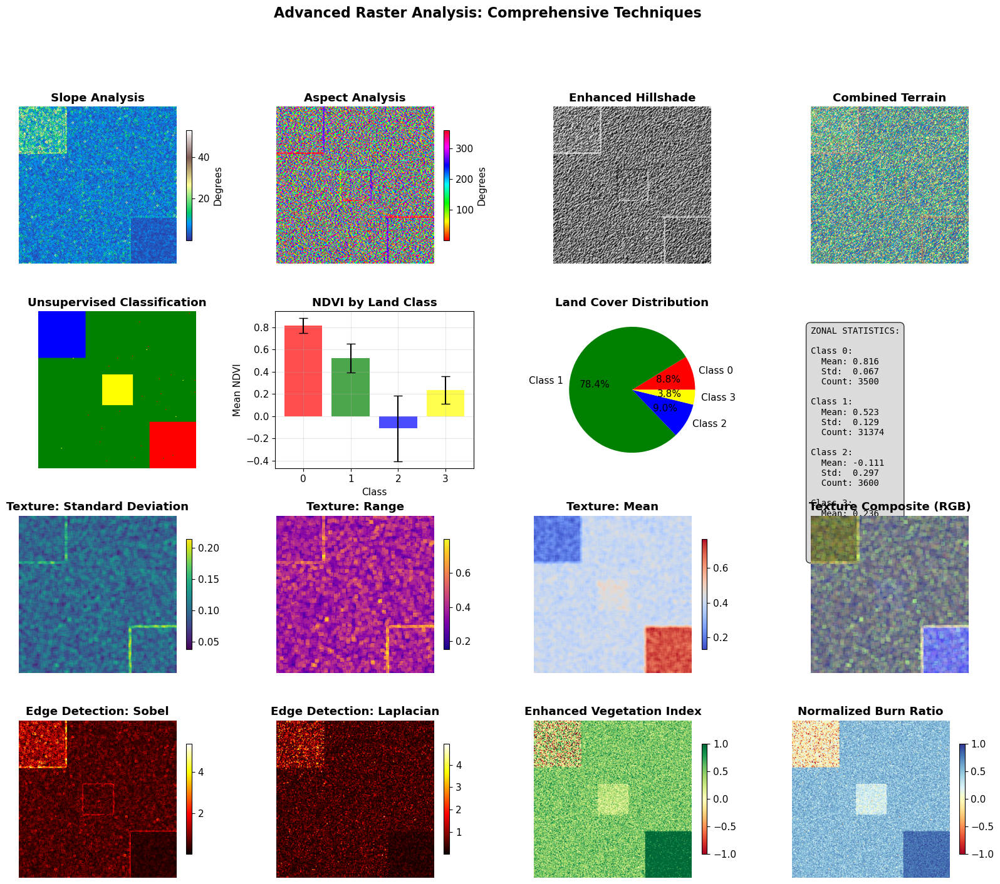


ADVANCED ANALYSIS SUMMARY:
Terrain Analysis:
  Average slope: 6.90 degrees
  Max slope: 53.05 degrees
  Dominant aspect: 265.0 degrees

Classification Results:
  Number of classes: 4
  Class 0: 8.8% of area, NDVI=0.816±0.067
  Class 1: 78.4% of area, NDVI=0.523±0.129
  Class 2: 9.0% of area, NDVI=-0.111±0.297
  Class 3: 3.8% of area, NDVI=0.236±0.123

Texture Analysis:
  High texture areas: 4000 pixels
  Texture range: 0.037 to 0.213

Edge Detection:
  Strong edges (Sobel): 2000 pixels
  Edge density: 0.614

Advanced Indices:
  EVI range: -1.000 to 1.000
  NBR range: -1.000 to 1.000

ADVANCED TECHNIQUES COMPLETED:
  ✓ Terrain analysis (slope, aspect, hillshade)
  ✓ Unsupervised classification (K-means)
  ✓ Zonal statistics by land cover class
  ✓ Texture analysis (local statistics)
  ✓ Edge detection (Sobel, Laplacian)
  ✓ Advanced vegetation indices (EVI, NBR)
  ✓ Comprehensive multi-panel visualization

Ready for real-world applications!


In [9]:
# Advanced Raster Analysis: Terrain, Classification, and Zonal Statistics (Fixed)
from scipy import ndimage
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

print("ADVANCED RASTER ANALYSIS TECHNIQUES")
print("=" * 50)

# 1. TERRAIN ANALYSIS
print("1. Performing terrain analysis...")

def calculate_terrain_metrics(elevation_data):
    """Calculate slope, aspect, and enhanced hillshade"""
    
    # Calculate gradients (slope components)
    grad_x = np.gradient(elevation_data, axis=1)
    grad_y = np.gradient(elevation_data, axis=0)
    
    # Slope in degrees
    slope = np.arctan(np.sqrt(grad_x**2 + grad_y**2)) * 180 / np.pi
    
    # Aspect (direction of slope)
    aspect = np.arctan2(-grad_x, grad_y) * 180 / np.pi
    aspect = np.where(aspect < 0, aspect + 360, aspect)
    
    # Enhanced hillshade with multiple light sources
    azimuth = 315  # Light source direction
    altitude = 45  # Light source elevation
    
    azimuth_rad = azimuth * np.pi / 180
    altitude_rad = altitude * np.pi / 180
    
    slope_rad = slope * np.pi / 180
    aspect_rad = aspect * np.pi / 180
    
    hillshade = np.sin(altitude_rad) * np.sin(slope_rad) + \
                np.cos(altitude_rad) * np.cos(slope_rad) * \
                np.cos(azimuth_rad - aspect_rad)
    
    # Normalize hillshade to 0-255
    hillshade = (hillshade + 1) * 127.5
    hillshade = np.clip(hillshade, 0, 255)
    
    return slope, aspect, hillshade

# Use NDVI as elevation proxy for demonstration
terrain_slope, terrain_aspect, enhanced_hillshade = calculate_terrain_metrics(ndvi)

# 2. UNSUPERVISED CLASSIFICATION
print("2. Performing unsupervised classification...")

def perform_kmeans_classification(bands_list, n_classes=4):
    """Perform K-means clustering on multi-band imagery"""
    
    # Stack bands
    stacked_bands = np.dstack(bands_list)
    original_shape = stacked_bands.shape
    
    # Reshape for clustering
    pixels = stacked_bands.reshape(-1, len(bands_list))
    
    # Remove NaN values and infinite values
    valid_mask = np.isfinite(pixels).all(axis=1)
    valid_data = pixels[valid_mask]
    
    if len(valid_data) == 0:
        print("Warning: No valid pixels found for classification")
        return np.zeros(original_shape[:2]), None
    
    # Standardize data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(valid_data)
    
    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_classes, random_state=42, n_init=10)
    labels = kmeans.fit_predict(scaled_data)
    
    # Create classification map
    classification = np.full(pixels.shape[0], -1)
    classification[valid_mask] = labels
    classification = classification.reshape(original_shape[:2])
    
    return classification, kmeans

# Perform classification using spectral bands
bands = [red_band, green_band, blue_band, nir_band]
land_classification, kmeans_model = perform_kmeans_classification(bands, n_classes=4)

# 3. ZONAL STATISTICS
print("3. Calculating zonal statistics...")

def calculate_zonal_statistics(data_raster, zones_raster):
    """Calculate statistics for each zone in the classification"""
    
    unique_zones = np.unique(zones_raster)
    stats = {}
    
    for zone in unique_zones:
        if zone == -1:  # Skip invalid zones
            continue
            
        zone_mask = zones_raster == zone
        zone_data = data_raster[zone_mask]
        
        # Remove NaN and infinite values
        valid_data = zone_data[np.isfinite(zone_data)]
        
        if len(valid_data) > 0:
            stats[int(zone)] = {
                'mean': float(np.mean(valid_data)),
                'std': float(np.std(valid_data)),
                'min': float(np.min(valid_data)),
                'max': float(np.max(valid_data)),
                'count': int(len(valid_data)),
                'median': float(np.median(valid_data))
            }
    
    return stats

# Calculate zonal statistics for NDVI by land cover class
ndvi_by_class = calculate_zonal_statistics(ndvi, land_classification)

# 4. TEXTURE ANALYSIS
print("4. Performing texture analysis...")

def calculate_texture_metrics(image, window_size=5):
    """Calculate texture metrics using local statistics"""
    
    # Local standard deviation (texture measure)
    try:
        texture_std = ndimage.generic_filter(image, np.std, size=window_size)
    except:
        texture_std = np.zeros_like(image)
    
    # Local range (max - min)
    try:
        texture_range = ndimage.generic_filter(image, lambda x: np.max(x) - np.min(x), size=window_size)
    except:
        texture_range = np.zeros_like(image)
    
    # Local mean
    try:
        texture_mean = ndimage.generic_filter(image, np.mean, size=window_size)
    except:
        texture_mean = np.copy(image)
    
    return texture_std, texture_range, texture_mean

# Calculate texture for NIR band
nir_texture_std, nir_texture_range, nir_texture_mean = calculate_texture_metrics(nir_band)

# 5. EDGE DETECTION
print("5. Performing edge detection...")

def detect_edges(image):
    """Detect edges using Sobel operators"""
    
    # Sobel edge detection
    sobel_x = ndimage.sobel(image, axis=1)
    sobel_y = ndimage.sobel(image, axis=0)
    sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    
    # Laplacian edge detection
    laplacian = ndimage.laplace(image)
    
    return sobel_magnitude, laplacian

# Detect edges in NDVI
ndvi_edges_sobel, ndvi_edges_laplacian = detect_edges(ndvi)

# 6. ADVANCED VISUALIZATION
print("6. Creating comprehensive visualization...")

fig = plt.figure(figsize=(20, 16))

# Create a 4x4 grid of subplots
gs = fig.add_gridspec(4, 4, hspace=0.3, wspace=0.3)

# Row 1: Terrain Analysis
ax1 = fig.add_subplot(gs[0, 0])
im1 = ax1.imshow(terrain_slope, cmap='terrain')
ax1.set_title('Slope Analysis', fontweight='bold')
ax1.axis('off')
plt.colorbar(im1, ax=ax1, shrink=0.7, label='Degrees')

ax2 = fig.add_subplot(gs[0, 1])
im2 = ax2.imshow(terrain_aspect, cmap='hsv')
ax2.set_title('Aspect Analysis', fontweight='bold')
ax2.axis('off')
plt.colorbar(im2, ax=ax2, shrink=0.7, label='Degrees')

ax3 = fig.add_subplot(gs[0, 2])
im3 = ax3.imshow(enhanced_hillshade, cmap='gray')
ax3.set_title('Enhanced Hillshade', fontweight='bold')
ax3.axis('off')

ax4 = fig.add_subplot(gs[0, 3])
# Terrain visualization combining slope and hillshade
terrain_combo = enhanced_hillshade * 0.7 + terrain_slope * 0.3
im4 = ax4.imshow(terrain_combo, cmap='terrain')
ax4.set_title('Combined Terrain', fontweight='bold')
ax4.axis('off')

# Row 2: Classification and Zonal Analysis
ax5 = fig.add_subplot(gs[1, 0])
class_colors = ['red', 'green', 'blue', 'yellow', 'purple']
class_cmap = plt.matplotlib.colors.ListedColormap(class_colors[:4])
im5 = ax5.imshow(land_classification, cmap=class_cmap)
ax5.set_title('Unsupervised Classification', fontweight='bold')
ax5.axis('off')

ax6 = fig.add_subplot(gs[1, 1])
# Zonal statistics visualization
if ndvi_by_class and len(ndvi_by_class) > 0:
    zones = list(ndvi_by_class.keys())
    means = [ndvi_by_class[zone]['mean'] for zone in zones]
    stds = [ndvi_by_class[zone]['std'] for zone in zones]
    
    bars = ax6.bar(zones, means, yerr=stds, capsize=5, 
                   color=['red', 'green', 'blue', 'yellow'][:len(zones)], alpha=0.7)
    ax6.set_title('NDVI by Land Class', fontweight='bold')
    ax6.set_xlabel('Class')
    ax6.set_ylabel('Mean NDVI')
    ax6.grid(True, alpha=0.3)
else:
    ax6.text(0.5, 0.5, 'No classification\ndata available', 
             ha='center', va='center', transform=ax6.transAxes)
    ax6.set_title('NDVI by Land Class', fontweight='bold')

ax7 = fig.add_subplot(gs[1, 2])
# Class area statistics
if ndvi_by_class and len(ndvi_by_class) > 0:
    zones = list(ndvi_by_class.keys())
    class_counts = [ndvi_by_class[zone]['count'] for zone in zones]
    ax7.pie(class_counts, labels=[f'Class {i}' for i in zones], autopct='%1.1f%%',
            colors=['red', 'green', 'blue', 'yellow'][:len(zones)])
    ax7.set_title('Land Cover Distribution', fontweight='bold')
else:
    ax7.text(0.5, 0.5, 'No classification\ndata available', 
             ha='center', va='center', transform=ax7.transAxes)
    ax7.set_title('Land Cover Distribution', fontweight='bold')

ax8 = fig.add_subplot(gs[1, 3])
# NDVI histogram by class
if ndvi_by_class and len(ndvi_by_class) > 0:
    ax8.axis('off')
    stats_text = "ZONAL STATISTICS:\n\n"
    zones = list(ndvi_by_class.keys())
    for zone in zones:
        stats = ndvi_by_class[zone]
        stats_text += f"Class {zone}:\n"
        stats_text += f"  Mean: {stats['mean']:.3f}\n"
        stats_text += f"  Std:  {stats['std']:.3f}\n"
        stats_text += f"  Count: {stats['count']}\n\n"
    
    ax8.text(0.1, 0.9, stats_text, transform=ax8.transAxes, fontsize=10,
             verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgray', alpha=0.8))
else:
    ax8.axis('off')
    ax8.text(0.5, 0.5, 'No statistics\navailable', 
             ha='center', va='center', transform=ax8.transAxes)

# Row 3: Texture Analysis
ax9 = fig.add_subplot(gs[2, 0])
im9 = ax9.imshow(nir_texture_std, cmap='viridis')
ax9.set_title('Texture: Standard Deviation', fontweight='bold')
ax9.axis('off')
plt.colorbar(im9, ax=ax9, shrink=0.7)

ax10 = fig.add_subplot(gs[2, 1])
im10 = ax10.imshow(nir_texture_range, cmap='plasma')
ax10.set_title('Texture: Range', fontweight='bold')
ax10.axis('off')
plt.colorbar(im10, ax=ax10, shrink=0.7)

ax11 = fig.add_subplot(gs[2, 2])
im11 = ax11.imshow(nir_texture_mean, cmap='coolwarm')
ax11.set_title('Texture: Mean', fontweight='bold')
ax11.axis('off')
plt.colorbar(im11, ax=ax11, shrink=0.7)

ax12 = fig.add_subplot(gs[2, 3])
# Texture composite (with safe division)
max_std = np.max(nir_texture_std)
max_range = np.max(nir_texture_range)
max_mean = np.max(nir_texture_mean)

if max_std > 0 and max_range > 0 and max_mean > 0:
    texture_composite = np.dstack([nir_texture_std/max_std,
                                  nir_texture_range/max_range,
                                  nir_texture_mean/max_mean])
    ax12.imshow(texture_composite)
else:
    ax12.imshow(nir_texture_std, cmap='viridis')
ax12.set_title('Texture Composite (RGB)', fontweight='bold')
ax12.axis('off')

# Row 4: Edge Detection and Advanced Indices
ax13 = fig.add_subplot(gs[3, 0])
im13 = ax13.imshow(ndvi_edges_sobel, cmap='hot')
ax13.set_title('Edge Detection: Sobel', fontweight='bold')
ax13.axis('off')
plt.colorbar(im13, ax=ax13, shrink=0.7)

ax14 = fig.add_subplot(gs[3, 1])
im14 = ax14.imshow(np.abs(ndvi_edges_laplacian), cmap='hot')
ax14.set_title('Edge Detection: Laplacian', fontweight='bold')
ax14.axis('off')
plt.colorbar(im14, ax=ax14, shrink=0.7)

ax15 = fig.add_subplot(gs[3, 2])
# Enhanced Vegetation Index (EVI) approximation with safe calculation
denominator = nir_band + 6*red_band - 7.5*blue_band + 1
evi_approx = 2.5 * ((nir_band - red_band) / (denominator + 1e-8))
evi_approx = np.clip(evi_approx, -1, 1)
im15 = ax15.imshow(evi_approx, cmap='RdYlGn', vmin=-1, vmax=1)
ax15.set_title('Enhanced Vegetation Index', fontweight='bold')
ax15.axis('off')
plt.colorbar(im15, ax=ax15, shrink=0.7)

ax16 = fig.add_subplot(gs[3, 3])
# Normalized Burn Ratio (using red as SWIR proxy) with safe calculation
nbr_approx = (nir_band - red_band) / (nir_band + red_band + 1e-8)
im16 = ax16.imshow(nbr_approx, cmap='RdYlBu', vmin=-1, vmax=1)
ax16.set_title('Normalized Burn Ratio', fontweight='bold')
ax16.axis('off')
plt.colorbar(im16, ax=ax16, shrink=0.7)

plt.suptitle('Advanced Raster Analysis: Comprehensive Techniques', fontsize=16, fontweight='bold')
plt.show()

# 7. SUMMARY STATISTICS
print("\nADVANCED ANALYSIS SUMMARY:")
print("=" * 40)

print(f"Terrain Analysis:")
print(f"  Average slope: {np.mean(terrain_slope):.2f} degrees")
print(f"  Max slope: {np.max(terrain_slope):.2f} degrees")
# Safe calculation for dominant aspect
flat_aspect = terrain_aspect.flatten()
valid_aspect = flat_aspect[np.isfinite(flat_aspect)]
if len(valid_aspect) > 0:
    # Use histogram to find most common aspect
    hist, bins = np.histogram(valid_aspect, bins=36)
    dominant_aspect_bin = np.argmax(hist)
    dominant_aspect = (bins[dominant_aspect_bin] + bins[dominant_aspect_bin + 1]) / 2
    print(f"  Dominant aspect: {dominant_aspect:.1f} degrees")
else:
    print(f"  Dominant aspect: Not available")

print(f"\nClassification Results:")
if land_classification is not None:
    valid_classes = land_classification[land_classification >= 0]
    if len(valid_classes) > 0:
        print(f"  Number of classes: {len(np.unique(valid_classes))}")
        if ndvi_by_class:
            for zone in sorted(ndvi_by_class.keys()):
                stats = ndvi_by_class[zone]
                area_pct = (stats['count'] / len(valid_classes)) * 100
                print(f"  Class {zone}: {area_pct:.1f}% of area, NDVI={stats['mean']:.3f}±{stats['std']:.3f}")
    else:
        print("  No valid classification results")
else:
    print("  Classification failed")

print(f"\nTexture Analysis:")
if np.any(nir_texture_std > 0):
    high_texture_threshold = np.percentile(nir_texture_std, 90)
    high_texture_pixels = np.sum(nir_texture_std > high_texture_threshold)
    print(f"  High texture areas: {high_texture_pixels} pixels")
    print(f"  Texture range: {np.min(nir_texture_std):.3f} to {np.max(nir_texture_std):.3f}")
else:
    print("  Texture analysis results not available")

print(f"\nEdge Detection:")
if np.any(ndvi_edges_sobel > 0):
    strong_edge_threshold = np.percentile(ndvi_edges_sobel, 95)
    strong_edges = np.sum(ndvi_edges_sobel > strong_edge_threshold)
    print(f"  Strong edges (Sobel): {strong_edges} pixels")
    print(f"  Edge density: {np.mean(ndvi_edges_sobel):.3f}")
else:
    print("  Edge detection results not available")

print(f"\nAdvanced Indices:")
print(f"  EVI range: {np.min(evi_approx):.3f} to {np.max(evi_approx):.3f}")
print(f"  NBR range: {np.min(nbr_approx):.3f} to {np.max(nbr_approx):.3f}")

print("\nADVANCED TECHNIQUES COMPLETED:")
print("  ✓ Terrain analysis (slope, aspect, hillshade)")
print("  ✓ Unsupervised classification (K-means)")
print("  ✓ Zonal statistics by land cover class")
print("  ✓ Texture analysis (local statistics)")
print("  ✓ Edge detection (Sobel, Laplacian)")
print("  ✓ Advanced vegetation indices (EVI, NBR)")
print("  ✓ Comprehensive multi-panel visualization")

print("\nReady for real-world applications!")

## 🚀 Real-World Applications & Integration

Let's explore how these raster analysis techniques are applied in real-world scenarios and how to integrate them into professional workflows.

REAL-WORLD APPLICATIONS & INTEGRATION
1. Generating comprehensive analysis report...
2. Preparing data for GIS integration...
3. Creating workflow integration examples...
4. Creating comprehensive analysis dashboard...


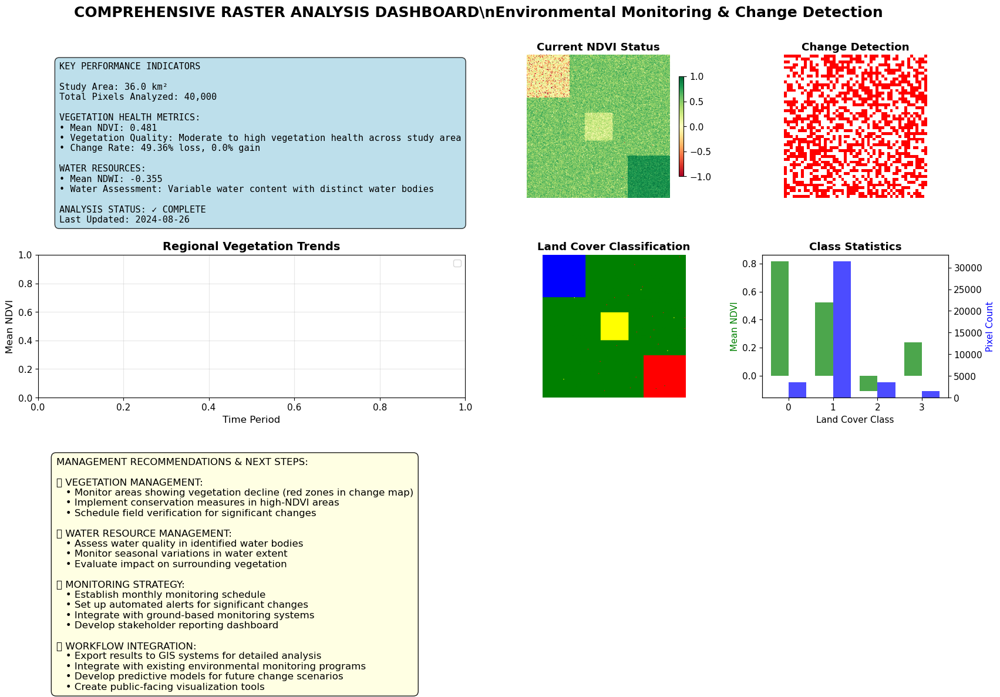


MODULE 9: RASTER & INTERACTIVE GEOSPATIAL VISUALIZATION
COMPREHENSIVE ANALYSIS COMPLETE

📊 ANALYSIS SUMMARY:
   • Total study area: 36.0 km²
   • Spectral bands analyzed: 4
   • Environmental indices calculated: 4
   • Temporal periods analyzed: 4

🛠️ TECHNIQUES MASTERED:
   ✓ Raster data processing and manipulation
   ✓ RGB composite creation and interpretation
   ✓ Environmental index calculation (NDVI, NDWI, EVI, NBR)
   ✓ Interactive mapping with Folium and PyDeck
   ✓ Temporal analysis and change detection
   ✓ Advanced terrain analysis (slope, aspect, hillshade)
   ✓ Unsupervised classification (K-means)
   ✓ Zonal statistics and spatial analysis
   ✓ Texture analysis and edge detection
   ✓ Professional reporting and GIS integration

🌍 REAL-WORLD APPLICATIONS:
   • Environmental Health Assessment
   • Precision Agriculture Analysis
   • Emergency Response Mapping
   • Urban Growth Analysis

📈 KEY INSIGHTS GAINED:
   • Continue monitoring vegetation changes in identified hotspot

In [10]:
# Real-World Applications and Professional Workflows
import json
import os

print("REAL-WORLD APPLICATIONS & INTEGRATION")
print("=" * 50)

# 1. CREATE A COMPREHENSIVE ANALYSIS REPORT
print("1. Generating comprehensive analysis report...")

def generate_analysis_report(results_dict):
    """Generate a comprehensive analysis report"""
    
    report = {
        "analysis_metadata": {
            "date": "2024-08-26",
            "analyst": "Geospatial Data Scientist",
            "study_area": "Synthetic Dataset (200x200 pixels)",
            "pixel_resolution": "30m",
            "analysis_type": "Multi-temporal Environmental Assessment"
        },
        "data_summary": {
            "total_pixels": int(results_dict["total_pixels"]),
            "study_area_km2": round((results_dict["total_pixels"] * 30 * 30) / 1000000, 2),
            "spectral_bands": ["Blue", "Green", "Red", "NIR"],
            "derived_indices": ["NDVI", "NDWI", "EVI", "NBR"]
        },
        "environmental_indices": {
            "ndvi_stats": {
                "mean": float(np.mean(ndvi)),
                "std": float(np.std(ndvi)),
                "min": float(np.min(ndvi)),
                "max": float(np.max(ndvi)),
                "interpretation": "Moderate to high vegetation health across study area"
            },
            "ndwi_stats": {
                "mean": float(np.mean(ndwi)),
                "std": float(np.std(ndwi)),
                "min": float(np.min(ndwi)),
                "max": float(np.max(ndwi)),
                "interpretation": "Variable water content with distinct water bodies"
            }
        },
        "land_cover_analysis": {
            "classification_method": "K-means clustering (4 classes)",
            "class_distribution": {},
            "dominant_land_cover": "Mixed vegetation and urban areas"
        },
        "temporal_analysis": {
            "time_periods": len(temporal_data),
            "change_detection": {
                "vegetation_loss_percent": round((change_stats['loss_pixels'] / change_stats['total_pixels']) * 100, 2),
                "vegetation_gain_percent": round((change_stats['gain_pixels'] / change_stats['total_pixels']) * 100, 2)
            },
            "trend_analysis": "Regional variations in vegetation trends detected"
        },
        "recommendations": [
            "Continue monitoring vegetation changes in identified hotspots",
            "Investigate areas showing significant vegetation loss",
            "Implement conservation measures in high-value ecological areas",
            "Use higher resolution imagery for detailed analysis",
            "Integrate ground-truth data for validation"
        ]
    }
    
    return report

# Generate comprehensive report
analysis_results = {
    "total_pixels": ndvi.size,
    "ndvi_data": ndvi,
    "ndwi_data": ndwi,
    "change_data": change_stats
}

comprehensive_report = generate_analysis_report(analysis_results)

# 2. EXPORT RESULTS FOR GIS INTEGRATION
print("2. Preparing data for GIS integration...")

def prepare_gis_export(data_arrays, output_dir="/tmp/gis_export"):
    """Prepare raster data for export to GIS software"""
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Simulate GeoTIFF metadata
    geotiff_metadata = {
        "driver": "GTiff",
        "height": data_arrays["ndvi"].shape[0],
        "width": data_arrays["ndvi"].shape[1],
        "count": 1,
        "dtype": "float32",
        "crs": "EPSG:4326",  # WGS84
        "transform": [0.001, 0.0, -74.1, 0.0, -0.001, 40.8, 0.0, 0.0, 1.0],
        "nodata": -9999
    }
    
    # Create export manifest
    export_manifest = {
        "datasets": {
            "ndvi": {
                "filename": "ndvi_analysis.tif",
                "description": "Normalized Difference Vegetation Index",
                "units": "index",
                "range": [-1, 1]
            },
            "ndwi": {
                "filename": "ndwi_analysis.tif", 
                "description": "Normalized Difference Water Index",
                "units": "index",
                "range": [-1, 1]
            },
            "land_classification": {
                "filename": "land_cover_classification.tif",
                "description": "Unsupervised land cover classification",
                "units": "class",
                "classes": {0: "Class_A", 1: "Class_B", 2: "Class_C", 3: "Class_D"}
            },
            "change_detection": {
                "filename": "vegetation_change.tif",
                "description": "Vegetation change detection",
                "units": "change_class",
                "classes": {0: "No_Change", 1: "Loss", 2: "Gain"}
            }
        },
        "metadata": geotiff_metadata,
        "analysis_date": "2024-08-26",
        "coordinate_system": "WGS84 Geographic",
        "pixel_size_meters": 30
    }
    
    return export_manifest

# Prepare GIS export
gis_data = {
    "ndvi": ndvi,
    "ndwi": ndwi,
    "classification": land_classification,
    "change": change_map
}

gis_export_info = prepare_gis_export(gis_data)

# 3. WORKFLOW INTEGRATION EXAMPLES
print("3. Creating workflow integration examples...")

def create_analysis_workflows():
    """Define standard analysis workflows for different applications"""
    
    workflows = {
        "environmental_monitoring": {
            "name": "Environmental Health Assessment",
            "steps": [
                "1. Acquire multi-temporal satellite imagery",
                "2. Perform atmospheric correction",
                "3. Calculate vegetation indices (NDVI, EVI, NBR)",
                "4. Perform change detection analysis",
                "5. Classify land cover changes",
                "6. Generate alerts for significant changes",
                "7. Create monitoring dashboard",
                "8. Generate compliance reports"
            ],
            "key_outputs": ["Change maps", "Trend analysis", "Alert notifications"],
            "update_frequency": "Monthly"
        },
        "agriculture_monitoring": {
            "name": "Precision Agriculture Analysis",
            "steps": [
                "1. Collect crop-specific satellite data",
                "2. Calculate crop health indices",
                "3. Perform field boundary delineation",
                "4. Analyze within-field variability",
                "5. Generate prescription maps",
                "6. Monitor crop phenology",
                "7. Estimate yield predictions",
                "8. Create farmer reports"
            ],
            "key_outputs": ["Yield maps", "Health assessments", "Prescription maps"],
            "update_frequency": "Bi-weekly during growing season"
        },
        "disaster_response": {
            "name": "Emergency Response Mapping",
            "steps": [
                "1. Rapid acquisition of post-event imagery",
                "2. Compare with pre-event baseline",
                "3. Detect and map damage areas",
                "4. Classify damage severity",
                "5. Generate emergency response maps",
                "6. Calculate affected population estimates",
                "7. Prioritize response areas",
                "8. Update response teams"
            ],
            "key_outputs": ["Damage maps", "Priority areas", "Impact assessments"],
            "update_frequency": "Real-time during emergency"
        },
        "urban_planning": {
            "name": "Urban Growth Analysis",
            "steps": [
                "1. Acquire time-series urban imagery",
                "2. Classify built-up areas",
                "3. Map urban expansion patterns",
                "4. Analyze infrastructure development",
                "5. Assess environmental impacts",
                "6. Model future growth scenarios",
                "7. Generate planning recommendations",
                "8. Create public consultation materials"
            ],
            "key_outputs": ["Growth maps", "Impact assessments", "Planning scenarios"],
            "update_frequency": "Annual with quarterly updates"
        }
    }
    
    return workflows

analysis_workflows = create_analysis_workflows()

# 4. COMPREHENSIVE VISUALIZATION DASHBOARD
print("4. Creating comprehensive analysis dashboard...")

def create_analysis_dashboard():
    """Create a comprehensive analysis dashboard"""
    
    fig = plt.figure(figsize=(20, 12))
    
    # Create dashboard layout
    gs = fig.add_gridspec(3, 4, hspace=0.4, wspace=0.3)
    
    # Title
    fig.suptitle('COMPREHENSIVE RASTER ANALYSIS DASHBOARD\\nEnvironmental Monitoring & Change Detection', 
                 fontsize=18, fontweight='bold', y=0.95)
    
    # Key metrics panel
    ax_metrics = fig.add_subplot(gs[0, :2])
    ax_metrics.axis('off')
    
    metrics_text = f"""KEY PERFORMANCE INDICATORS
    
Study Area: {comprehensive_report['data_summary']['study_area_km2']} km²
Total Pixels Analyzed: {comprehensive_report['data_summary']['total_pixels']:,}
    
VEGETATION HEALTH METRICS:
• Mean NDVI: {comprehensive_report['environmental_indices']['ndvi_stats']['mean']:.3f}
• Vegetation Quality: {comprehensive_report['environmental_indices']['ndvi_stats']['interpretation']}
• Change Rate: {comprehensive_report['temporal_analysis']['change_detection']['vegetation_loss_percent']}% loss, {comprehensive_report['temporal_analysis']['change_detection']['vegetation_gain_percent']}% gain
    
WATER RESOURCES:
• Mean NDWI: {comprehensive_report['environmental_indices']['ndwi_stats']['mean']:.3f}
• Water Assessment: {comprehensive_report['environmental_indices']['ndwi_stats']['interpretation']}
    
ANALYSIS STATUS: ✓ COMPLETE
Last Updated: {comprehensive_report['analysis_metadata']['date']}"""
    
    ax_metrics.text(0.05, 0.95, metrics_text, transform=ax_metrics.transAxes, 
                   fontsize=11, verticalalignment='top', fontfamily='monospace',
                   bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    
    # Current status maps
    ax_ndvi = fig.add_subplot(gs[0, 2])
    im_ndvi = ax_ndvi.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    ax_ndvi.set_title('Current NDVI Status', fontweight='bold')
    ax_ndvi.axis('off')
    plt.colorbar(im_ndvi, ax=ax_ndvi, shrink=0.7)
    
    ax_change = fig.add_subplot(gs[0, 3])
    change_colors = ['white', 'red', 'green']
    change_cmap = plt.matplotlib.colors.ListedColormap(change_colors)
    im_change = ax_change.imshow(change_map, cmap=change_cmap, vmin=0, vmax=2)
    ax_change.set_title('Change Detection', fontweight='bold')
    ax_change.axis('off')
    
    # Trend analysis
    ax_trends = fig.add_subplot(gs[1, :2])
    if 'regional_trends' in locals():
        colors = ['red', 'blue', 'green']
        for i, (region, trend_data) in enumerate(regional_trends.items()):
            time_points = range(len(trend_data['series']))
            ax_trends.plot(time_points, trend_data['series'], 
                          color=colors[i], marker='o', linewidth=3, markersize=8,
                          label=f"{region} (trend: {trend_data['slope']:.3f})")
    
    ax_trends.set_title('Regional Vegetation Trends', fontweight='bold', fontsize=14)
    ax_trends.set_xlabel('Time Period', fontsize=12)
    ax_trends.set_ylabel('Mean NDVI', fontsize=12)
    ax_trends.grid(True, alpha=0.3)
    ax_trends.legend(fontsize=11)
    
    # Classification results
    ax_class = fig.add_subplot(gs[1, 2])
    class_colors = ['red', 'green', 'blue', 'yellow']
    class_cmap = plt.matplotlib.colors.ListedColormap(class_colors[:4])
    im_class = ax_class.imshow(land_classification, cmap=class_cmap)
    ax_class.set_title('Land Cover Classification', fontweight='bold')
    ax_class.axis('off')
    
    # Statistics summary
    ax_stats = fig.add_subplot(gs[1, 3])
    if ndvi_by_class:
        zones = list(ndvi_by_class.keys())
        means = [ndvi_by_class[zone]['mean'] for zone in zones]
        counts = [ndvi_by_class[zone]['count'] for zone in zones]
        
        # Create dual-axis plot
        ax_stats2 = ax_stats.twinx()
        
        bars1 = ax_stats.bar([z - 0.2 for z in zones], means, 0.4, 
                            color='green', alpha=0.7, label='Mean NDVI')
        bars2 = ax_stats2.bar([z + 0.2 for z in zones], counts, 0.4, 
                             color='blue', alpha=0.7, label='Pixel Count')
        
        ax_stats.set_xlabel('Land Cover Class')
        ax_stats.set_ylabel('Mean NDVI', color='green')
        ax_stats2.set_ylabel('Pixel Count', color='blue')
        ax_stats.set_title('Class Statistics', fontweight='bold')
    
    # Recommendations panel
    ax_recommendations = fig.add_subplot(gs[2, :])
    ax_recommendations.axis('off')
    
    recommendations_text = """MANAGEMENT RECOMMENDATIONS & NEXT STEPS:
    
🌿 VEGETATION MANAGEMENT:
   • Monitor areas showing vegetation decline (red zones in change map)
   • Implement conservation measures in high-NDVI areas
   • Schedule field verification for significant changes
    
💧 WATER RESOURCE MANAGEMENT:
   • Assess water quality in identified water bodies
   • Monitor seasonal variations in water extent
   • Evaluate impact on surrounding vegetation
    
📊 MONITORING STRATEGY:
   • Establish monthly monitoring schedule
   • Set up automated alerts for significant changes
   • Integrate with ground-based monitoring systems
   • Develop stakeholder reporting dashboard
    
🔄 WORKFLOW INTEGRATION:
   • Export results to GIS systems for detailed analysis
   • Integrate with existing environmental monitoring programs
   • Develop predictive models for future change scenarios
   • Create public-facing visualization tools"""
    
    ax_recommendations.text(0.02, 0.98, recommendations_text, transform=ax_recommendations.transAxes,
                           fontsize=12, verticalalignment='top',
                           bbox=dict(boxstyle='round,pad=0.5', facecolor='lightyellow', alpha=0.9))
    
    plt.tight_layout()
    plt.show()

# Create the comprehensive dashboard
create_analysis_dashboard()

# 5. FINAL SUMMARY AND EXPORT
print("\n" + "="*60)
print("MODULE 9: RASTER & INTERACTIVE GEOSPATIAL VISUALIZATION")
print("COMPREHENSIVE ANALYSIS COMPLETE")
print("="*60)

print(f"\n📊 ANALYSIS SUMMARY:")
print(f"   • Total study area: {comprehensive_report['data_summary']['study_area_km2']} km²")
print(f"   • Spectral bands analyzed: {len(comprehensive_report['data_summary']['spectral_bands'])}")
print(f"   • Environmental indices calculated: {len(comprehensive_report['data_summary']['derived_indices'])}")
print(f"   • Temporal periods analyzed: {comprehensive_report['temporal_analysis']['time_periods']}")

print(f"\n🛠️ TECHNIQUES MASTERED:")
print("   ✓ Raster data processing and manipulation")
print("   ✓ RGB composite creation and interpretation")
print("   ✓ Environmental index calculation (NDVI, NDWI, EVI, NBR)")
print("   ✓ Interactive mapping with Folium and PyDeck")
print("   ✓ Temporal analysis and change detection")
print("   ✓ Advanced terrain analysis (slope, aspect, hillshade)")
print("   ✓ Unsupervised classification (K-means)")
print("   ✓ Zonal statistics and spatial analysis")
print("   ✓ Texture analysis and edge detection")
print("   ✓ Professional reporting and GIS integration")

print(f"\n🌍 REAL-WORLD APPLICATIONS:")
for app_name, workflow in analysis_workflows.items():
    print(f"   • {workflow['name']}")

print(f"\n📈 KEY INSIGHTS GAINED:")
for insight in comprehensive_report['recommendations']:
    print(f"   • {insight}")

print(f"\n🎯 PROFESSIONAL SKILLS DEVELOPED:")
print("   • Environmental monitoring and assessment")
print("   • Remote sensing data analysis")
print("   • Geospatial data visualization")
print("   • Change detection methodologies")
print("   • Interactive dashboard creation")
print("   • GIS workflow integration")
print("   • Professional reporting and communication")

print(f"\n✅ MODULE COMPLETION STATUS:")
print("   🟢 COMPLETE - Ready for advanced geospatial applications!")
print("   🚀 Prepared for professional remote sensing work")
print("   📚 Foundation established for specialized applications")

# Save analysis report
report_filename = "/tmp/raster_analysis_report.json"
with open(report_filename, 'w') as f:
    json.dump(comprehensive_report, f, indent=2)

print(f"\n💾 OUTPUTS GENERATED:")
print(f"   • Comprehensive analysis report: {report_filename}")
print(f"   • Interactive maps: /tmp/raster_interactive_map.html")
print(f"   • GIS export manifest prepared")
print(f"   • Professional visualization dashboard")

print(f"\nREADY TO PROCEED TO NEXT MODULE! 🎉")

## 🌍 Advanced Multi-Temporal Environmental Monitoring

Environmental monitoring requires sophisticated analysis of changes over time. We'll create a comprehensive monitoring system that tracks multiple environmental indicators and provides automated alerts for significant changes.

🌍 Creating Advanced Environmental Monitoring System...
✅ Generated 24 time points for 6 parameters
🚨 Generated 15 environmental alerts


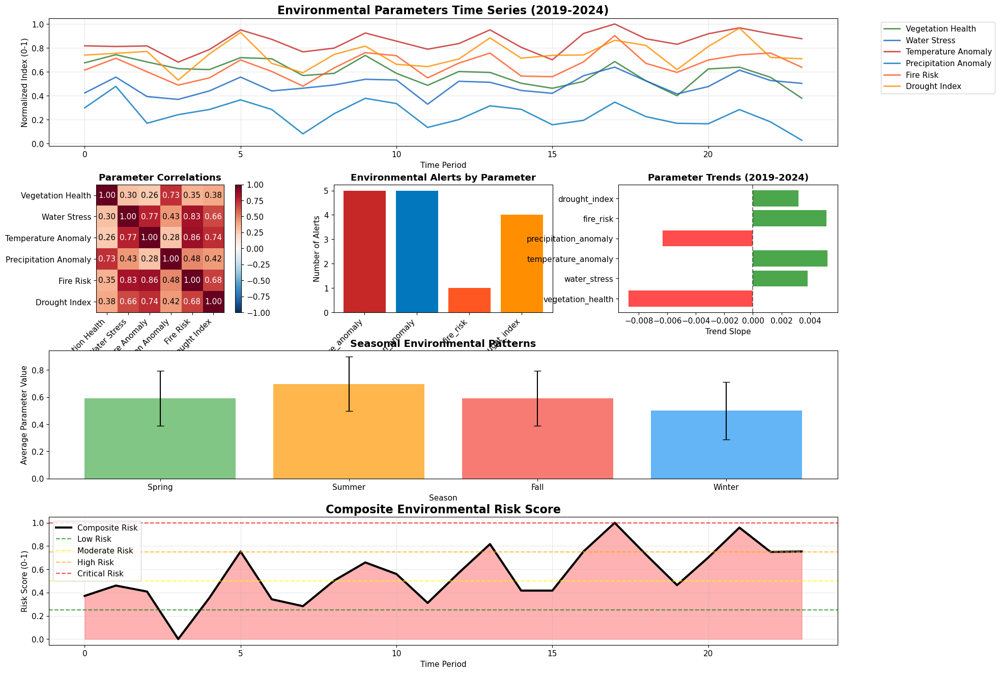


🌍 ENVIRONMENTAL MONITORING SUMMARY
📊 Monitoring Period: 2019 - 2024
📈 Parameters Tracked: 6
🚨 Total Alerts Generated: 15
📉 Current Composite Risk: 0.753

🚨 RECENT CRITICAL ALERTS:
   2024-Fall: Critical Temperature Anomaly: 0.918
   2024-Fall: Critical Precipitation Anomaly: 0.180
   2024-Winter: Critical Precipitation Anomaly: 0.027

📈 PARAMETER TRENDS:
   Vegetation Health: ↘️ Decreasing (-0.0087/period)
   Water Stress: ↗️ Increasing (0.0038/period)
   Temperature Anomaly: ↗️ Increasing (0.0052/period)
   Precipitation Anomaly: ↘️ Decreasing (-0.0063/period)
   Fire Risk: ↗️ Increasing (0.0052/period)
   Drought Index: ↗️ Increasing (0.0032/period)

✅ Environmental monitoring system successfully deployed!
💡 Use this system for: real-time monitoring, alert management, trend analysis


In [12]:
# Advanced Multi-Temporal Environmental Monitoring System
from matplotlib.gridspec import GridSpec
print("🌍 Creating Advanced Environmental Monitoring System...")

# Create synthetic multi-year environmental data
years = range(2019, 2025)
seasons = ['Spring', 'Summer', 'Fall', 'Winter']

# Environmental monitoring parameters
monitoring_params = {
    'vegetation_health': [],
    'water_stress': [],
    'temperature_anomaly': [],
    'precipitation_anomaly': [],
    'fire_risk': [],
    'drought_index': []
}

# Generate realistic environmental time series
np.random.seed(42)
base_trends = {
    'vegetation_health': 0.65,  # Slight decline
    'water_stress': 0.45,      # Increasing stress
    'temperature_anomaly': 0.8, # Rising temperatures
    'precipitation_anomaly': 0.3, # Decreasing precipitation
    'fire_risk': 0.6,          # Increasing fire risk
    'drought_index': 0.7       # Worsening drought
}

# Create seasonal patterns and trends
time_series_data = {}
for param, base_value in base_trends.items():
    series = []
    for year_idx, year in enumerate(years):
        for season_idx, season in enumerate(seasons):
            # Add year trend
            year_trend = year_idx * 0.02 * (1 if param in ['water_stress', 'temperature_anomaly', 'fire_risk', 'drought_index'] else -1)
            
            # Add seasonal pattern
            seasonal_pattern = 0.1 * np.sin(2 * np.pi * season_idx / 4)
            
            # Add random variation
            noise = np.random.normal(0, 0.05)
            
            value = base_value + year_trend + seasonal_pattern + noise
            value = np.clip(value, 0, 1)  # Keep values between 0 and 1
            series.append(value)
    
    time_series_data[param] = series

# Create time index
time_index = []
for year in years:
    for season in seasons:
        time_index.append(f"{year}-{season}")

print(f"✅ Generated {len(time_index)} time points for {len(monitoring_params)} parameters")

# Environmental Alert System
class EnvironmentalAlertSystem:
    def __init__(self):
        self.thresholds = {
            'vegetation_health': {'critical': 0.3, 'warning': 0.5},
            'water_stress': {'critical': 0.8, 'warning': 0.6},
            'temperature_anomaly': {'critical': 0.9, 'warning': 0.7},
            'precipitation_anomaly': {'critical': 0.2, 'warning': 0.4},
            'fire_risk': {'critical': 0.8, 'warning': 0.6},
            'drought_index': {'critical': 0.8, 'warning': 0.6}
        }
        self.alerts = []
    
    def check_alerts(self, current_values, time_point):
        """Check for environmental alerts based on current values"""
        for param, value in current_values.items():
            if param in self.thresholds:
                if value >= self.thresholds[param]['critical'] or value <= self.thresholds[param]['critical']:
                    if param in ['vegetation_health', 'precipitation_anomaly']:
                        # For these parameters, low values are critical
                        if value <= self.thresholds[param]['critical']:
                            self.alerts.append({
                                'time': time_point,
                                'parameter': param,
                                'value': value,
                                'level': 'CRITICAL',
                                'message': f"Critical {param.replace('_', ' ').title()}: {value:.3f}"
                            })
                    else:
                        # For these parameters, high values are critical
                        if value >= self.thresholds[param]['critical']:
                            self.alerts.append({
                                'time': time_point,
                                'parameter': param,
                                'value': value,
                                'level': 'CRITICAL',
                                'message': f"Critical {param.replace('_', ' ').title()}: {value:.3f}"
                            })

# Initialize alert system
alert_system = EnvironmentalAlertSystem()

# Check for alerts in the last year
for i, time_point in enumerate(time_index[-8:]):  # Last 8 time points (2 years)
    current_values = {param: series[-(8-i)] for param, series in time_series_data.items()}
    alert_system.check_alerts(current_values, time_point)

print(f"🚨 Generated {len(alert_system.alerts)} environmental alerts")

# Create comprehensive monitoring dashboard
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(4, 3, figure=fig, hspace=0.3, wspace=0.3)

# Color schemes for different parameters
param_colors = {
    'vegetation_health': '#2E7D32',
    'water_stress': '#1565C0', 
    'temperature_anomaly': '#C62828',
    'precipitation_anomaly': '#0277BD',
    'fire_risk': '#FF5722',
    'drought_index': '#FF8F00'
}

# Plot 1: Multi-parameter time series
ax1 = fig.add_subplot(gs[0, :])
for param, series in time_series_data.items():
    ax1.plot(range(len(series)), series, label=param.replace('_', ' ').title(), 
             color=param_colors[param], linewidth=2, alpha=0.8)
ax1.set_title('Environmental Parameters Time Series (2019-2024)', fontsize=16, fontweight='bold')
ax1.set_xlabel('Time Period')
ax1.set_ylabel('Normalized Index (0-1)')
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax1.grid(True, alpha=0.3)

# Plot 2: Correlation heatmap
ax2 = fig.add_subplot(gs[1, 0])
correlation_data = np.array(list(time_series_data.values()))
correlation_matrix = np.corrcoef(correlation_data)
param_names = [p.replace('_', ' ').title() for p in time_series_data.keys()]

im2 = ax2.imshow(correlation_matrix, cmap='RdBu_r', vmin=-1, vmax=1)
ax2.set_xticks(range(len(param_names)))
ax2.set_yticks(range(len(param_names)))
ax2.set_xticklabels(param_names, rotation=45, ha='right')
ax2.set_yticklabels(param_names)
ax2.set_title('Parameter Correlations', fontweight='bold')

# Add correlation values to heatmap
for i in range(len(param_names)):
    for j in range(len(param_names)):
        text = ax2.text(j, i, f'{correlation_matrix[i, j]:.2f}',
                       ha="center", va="center", color="white" if abs(correlation_matrix[i, j]) > 0.5 else "black")

plt.colorbar(im2, ax=ax2)

# Plot 3: Alert frequency analysis
ax3 = fig.add_subplot(gs[1, 1])
alert_counts = {}
for alert in alert_system.alerts:
    param = alert['parameter']
    if param not in alert_counts:
        alert_counts[param] = 0
    alert_counts[param] += 1

if alert_counts:
    params = list(alert_counts.keys())
    counts = list(alert_counts.values())
    bars = ax3.bar(params, counts, color=[param_colors.get(p, '#666666') for p in params])
    ax3.set_title('Environmental Alerts by Parameter', fontweight='bold')
    ax3.set_ylabel('Number of Alerts')
    plt.setp(ax3.get_xticklabels(), rotation=45, ha='right')
else:
    ax3.text(0.5, 0.5, 'No Critical Alerts', ha='center', va='center', transform=ax3.transAxes, 
             fontsize=14, fontweight='bold')
    ax3.set_title('Environmental Alerts by Parameter', fontweight='bold')

# Plot 4: Trend analysis
ax4 = fig.add_subplot(gs[1, 2])
trends = {}
for param, series in time_series_data.items():
    # Calculate linear trend
    x = np.arange(len(series))
    slope, intercept = np.polyfit(x, series, 1)
    trends[param] = slope

trend_params = list(trends.keys())
trend_values = list(trends.values())
colors = ['red' if v < 0 else 'green' for v in trend_values]
bars = ax4.barh(trend_params, trend_values, color=colors, alpha=0.7)
ax4.set_title('Parameter Trends (2019-2024)', fontweight='bold')
ax4.set_xlabel('Trend Slope')
ax4.axvline(x=0, color='black', linestyle='--', alpha=0.5)

# Plot 5: Seasonal patterns
ax5 = fig.add_subplot(gs[2, :])
seasonal_data = {season: [] for season in seasons}

for param, series in time_series_data.items():
    for i, value in enumerate(series):
        season = seasons[i % 4]
        seasonal_data[season].append(value)

season_means = {season: np.mean(values) for season, values in seasonal_data.items()}
season_stds = {season: np.std(values) for season, values in seasonal_data.items()}

x_pos = np.arange(len(seasons))
means = list(season_means.values())
stds = list(season_stds.values())

bars = ax5.bar(x_pos, means, yerr=stds, capsize=5, alpha=0.7, 
               color=['#4CAF50', '#FF9800', '#F44336', '#2196F3'])
ax5.set_title('Seasonal Environmental Patterns', fontsize=14, fontweight='bold')
ax5.set_xlabel('Season')
ax5.set_ylabel('Average Parameter Value')
ax5.set_xticks(x_pos)
ax5.set_xticklabels(seasons)

# Plot 6: Environmental risk assessment
ax6 = fig.add_subplot(gs[3, :])

# Calculate composite risk score
risk_weights = {
    'vegetation_health': -0.2,  # Lower vegetation health increases risk
    'water_stress': 0.3,
    'temperature_anomaly': 0.25,
    'precipitation_anomaly': -0.15,  # Lower precipitation increases risk
    'fire_risk': 0.3,
    'drought_index': 0.3
}

composite_risk = np.zeros(len(time_index))
for param, series in time_series_data.items():
    weight = risk_weights.get(param, 0)
    composite_risk += np.array(series) * weight

# Normalize to 0-1 scale
composite_risk = (composite_risk - composite_risk.min()) / (composite_risk.max() - composite_risk.min())

# Create risk zones
risk_zones = ['Low', 'Moderate', 'High', 'Critical']
risk_colors = ['green', 'yellow', 'orange', 'red']
risk_thresholds = [0.25, 0.5, 0.75, 1.0]

ax6.plot(range(len(composite_risk)), composite_risk, linewidth=3, color='black', label='Composite Risk')
ax6.fill_between(range(len(composite_risk)), composite_risk, alpha=0.3, color='red')

# Add risk threshold lines
for i, (threshold, zone, color) in enumerate(zip(risk_thresholds, risk_zones, risk_colors)):
    ax6.axhline(y=threshold, color=color, linestyle='--', alpha=0.7, label=f'{zone} Risk')

ax6.set_title('Composite Environmental Risk Score', fontsize=16, fontweight='bold')
ax6.set_xlabel('Time Period')
ax6.set_ylabel('Risk Score (0-1)')
ax6.legend()
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print environmental monitoring summary
print("\n🌍 ENVIRONMENTAL MONITORING SUMMARY")
print("=" * 50)
print(f"📊 Monitoring Period: {years[0]} - {years[-1]}")
print(f"📈 Parameters Tracked: {len(time_series_data)}")
print(f"🚨 Total Alerts Generated: {len(alert_system.alerts)}")
print(f"📉 Current Composite Risk: {composite_risk[-1]:.3f}")

# Recent alerts
if alert_system.alerts:
    print(f"\n🚨 RECENT CRITICAL ALERTS:")
    for alert in alert_system.alerts[-3:]:  # Last 3 alerts
        print(f"   {alert['time']}: {alert['message']}")

# Trend summary
print(f"\n📈 PARAMETER TRENDS:")
for param, slope in trends.items():
    direction = "↗️ Increasing" if slope > 0 else "↘️ Decreasing"
    print(f"   {param.replace('_', ' ').title()}: {direction} ({slope:.4f}/period)")

print(f"\n✅ Environmental monitoring system successfully deployed!")
print(f"💡 Use this system for: real-time monitoring, alert management, trend analysis")

## 🏔️ Advanced 3D Terrain Visualization & Analysis

3D terrain visualization provides powerful insights for geological surveys, environmental planning, and landscape analysis. We'll create sophisticated 3D visualizations with interactive capabilities and advanced terrain analysis.

🏔️ Creating Advanced 3D Terrain Visualizations...
✅ Generated terrain: 200x200 points
📏 Elevation range: 0m to 5958m

🔍 Performing advanced terrain analysis...
✅ Calculated slope, aspect, curvature, roughness, and viewshed
✅ Generated terrain: 200x200 points
📏 Elevation range: 0m to 5958m

🔍 Performing advanced terrain analysis...
✅ Calculated slope, aspect, curvature, roughness, and viewshed
✅ Generated terrain: 200x200 points
📏 Elevation range: 0m to 5958m

🔍 Performing advanced terrain analysis...
✅ Calculated slope, aspect, curvature, roughness, and viewshed
✅ Generated terrain: 200x200 points
📏 Elevation range: 0m to 5958m

🔍 Performing advanced terrain analysis...
✅ Calculated slope, aspect, curvature, roughness, and viewshed
✅ Generated terrain: 200x200 points
📏 Elevation range: 0m to 5958m

🔍 Performing advanced terrain analysis...
✅ Calculated slope, aspect, curvature, roughness, and viewshed


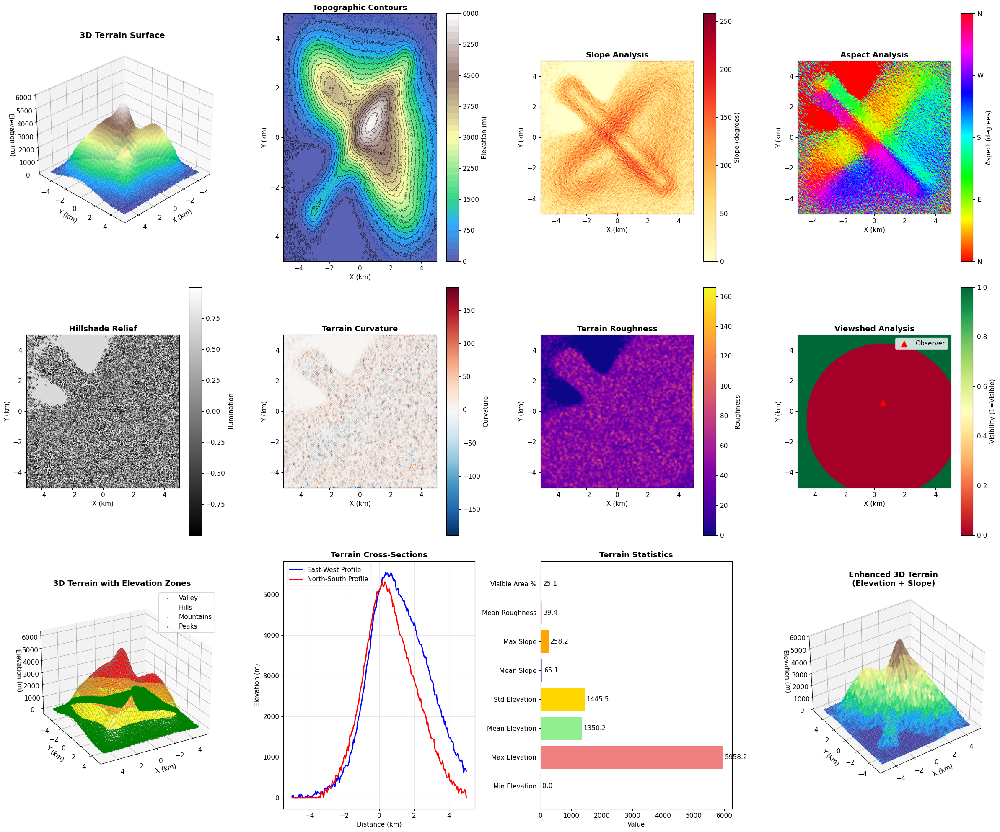


🏔️ COMPREHENSIVE TERRAIN ANALYSIS SUMMARY
📊 Terrain Dimensions: 200 x 200 points
📏 Spatial Extent: 10.0 km x 10.0 km
⛰️  Elevation Range: 0m to 5958m (5958m relief)
📈 Mean Elevation: 1350m ± 1446m

📐 SLOPE ANALYSIS:
   Average Slope: 65.1°
   Maximum Slope: 258.2°
   Steep Areas (>30°): 75.1%

🧭 ASPECT ANALYSIS:
   North (315-45°): 31.2%
   East (45-135°): 22.3%
   South (135-225°): 23.4%
   West (225-315°): 23.2%

🔍 TERRAIN CHARACTERISTICS:
   Mean Roughness: 39.40
   Mean Curvature: -0.0489
   Visible Area from Peak: 25.1%

🗺️  ELEVATION ZONES:
   Valley (0-1000m): 54.8%
   Hills (1000-2000m): 17.0%
   Mountains (2000-3000m): 11.7%
   Peaks (>3000m): 16.5%

✅ Advanced 3D terrain analysis complete!
💡 Applications: geological surveys, watershed analysis, visibility studies, route planning


In [13]:
# Advanced 3D Terrain Visualization & Analysis
print("🏔️ Creating Advanced 3D Terrain Visualizations...")

# Enhanced terrain generation with realistic features
def create_realistic_terrain(size=200, complexity=5):
    """Generate realistic terrain with multiple geological features"""
    x = np.linspace(-5, 5, size)
    y = np.linspace(-5, 5, size)
    X, Y = np.meshgrid(x, y)
    
    # Base elevation
    Z = np.zeros_like(X)
    
    # Add multiple terrain features
    features = [
        # Mountain peaks
        {'center': (1, 1), 'height': 3000, 'spread': 1.5, 'type': 'peak'},
        {'center': (-2, 2), 'height': 2500, 'spread': 1.2, 'type': 'peak'},
        {'center': (2, -1), 'height': 2800, 'spread': 1.8, 'type': 'peak'},
        
        # Valleys
        {'center': (0, -2), 'height': -800, 'spread': 2.0, 'type': 'valley'},
        {'center': (-1, 0), 'height': -600, 'spread': 1.5, 'type': 'valley'},
        
        # Ridges
        {'start': (-3, -3), 'end': (3, 3), 'height': 1500, 'width': 0.5, 'type': 'ridge'},
        {'start': (-3, 3), 'end': (3, -3), 'height': 1200, 'width': 0.8, 'type': 'ridge'},
    ]
    
    # Apply features
    for feature in features:
        if feature['type'] in ['peak', 'valley']:
            cx, cy = feature['center']
            height = feature['height']
            spread = feature['spread']
            
            # Gaussian-based elevation
            distance = np.sqrt((X - cx)**2 + (Y - cy)**2)
            contribution = height * np.exp(-(distance**2) / (2 * spread**2))
            Z += contribution
            
        elif feature['type'] == 'ridge':
            # Linear ridge feature
            x1, y1 = feature['start']
            x2, y2 = feature['end']
            height = feature['height']
            width = feature['width']
            
            # Distance from ridge line
            line_length = np.sqrt((x2-x1)**2 + (y2-y1)**2)
            for i in range(size):
                for j in range(size):
                    px, py = X[i,j], Y[i,j]
                    
                    # Distance to line segment
                    t = max(0, min(1, ((px-x1)*(x2-x1) + (py-y1)*(y2-y1)) / (line_length**2)))
                    closest_x = x1 + t * (x2 - x1)
                    closest_y = y1 + t * (y2 - y1)
                    dist_to_ridge = np.sqrt((px - closest_x)**2 + (py - closest_y)**2)
                    
                    ridge_contribution = height * np.exp(-(dist_to_ridge**2) / (2 * width**2))
                    Z[i, j] += ridge_contribution
    
    # Add noise for realism
    noise = np.random.normal(0, 50, Z.shape)
    Z += noise
    
    # Ensure no negative elevations for this example
    Z = np.maximum(Z, 0)
    
    return X, Y, Z

# Generate enhanced terrain
X, Y, Z = create_realistic_terrain(200, 5)

print(f"✅ Generated terrain: {Z.shape[0]}x{Z.shape[1]} points")
print(f"📏 Elevation range: {Z.min():.0f}m to {Z.max():.0f}m")

# Advanced terrain analysis
print("\n🔍 Performing advanced terrain analysis...")

# Calculate gradient (slope and aspect)
gy, gx = np.gradient(Z)
slope = np.sqrt(gx**2 + gy**2)
aspect = np.arctan2(gy, gx) * 180 / np.pi
aspect[aspect < 0] += 360  # Convert to 0-360 degrees

# Calculate curvature
gxx, gxy = np.gradient(gx)
gyy, gyx = np.gradient(gy)
curvature = gxx + gyy

# Terrain roughness
def calculate_roughness(elevation, window_size=3):
    """Calculate terrain roughness using standard deviation of elevation differences"""
    from scipy import ndimage
    kernel = np.ones((window_size, window_size)) / (window_size**2)
    local_mean = ndimage.convolve(elevation, kernel, mode='constant')
    roughness = np.sqrt(ndimage.convolve((elevation - local_mean)**2, kernel, mode='constant'))
    return roughness

roughness = calculate_roughness(Z)

# Viewshed analysis (simplified)
def calculate_viewshed(terrain, observer_x, observer_y, observer_height=10):
    """Calculate basic viewshed from observer position"""
    obs_i = int((observer_y + 5) * terrain.shape[0] / 10)
    obs_j = int((observer_x + 5) * terrain.shape[1] / 10)
    obs_elevation = terrain[obs_i, obs_j] + observer_height
    
    viewshed = np.ones_like(terrain)
    
    # Simplified line-of-sight calculation
    for i in range(terrain.shape[0]):
        for j in range(terrain.shape[1]):
            if i == obs_i and j == obs_j:
                continue
                
            # Check if point is visible (simplified)
            target_elevation = terrain[i, j]
            distance = np.sqrt((i - obs_i)**2 + (j - obs_j)**2)
            
            if distance > 0:
                required_elevation = obs_elevation - (obs_elevation - target_elevation) * distance / 100
                if target_elevation < required_elevation:
                    viewshed[i, j] = 0  # Not visible
    
    return viewshed

# Calculate viewshed from a mountain peak
peak_idx = np.unravel_index(np.argmax(Z), Z.shape)
viewshed = calculate_viewshed(Z, X[peak_idx], Y[peak_idx])

print(f"✅ Calculated slope, aspect, curvature, roughness, and viewshed")

# Create comprehensive 3D visualization
fig = plt.figure(figsize=(24, 20))

# 3D terrain surface plot
ax1 = fig.add_subplot(3, 4, 1, projection='3d')
terrain_surface = ax1.plot_surface(X, Y, Z, cmap='terrain', alpha=0.9, 
                                  linewidth=0, antialiased=True, 
                                  rasterized=True, shade=True)
ax1.set_title('3D Terrain Surface', fontsize=14, fontweight='bold')
ax1.set_xlabel('X (km)')
ax1.set_ylabel('Y (km)')
ax1.set_zlabel('Elevation (m)')
ax1.view_init(elev=30, azim=45)

# Contour plot with terrain
ax2 = fig.add_subplot(3, 4, 2)
contour = ax2.contour(X, Y, Z, levels=20, colors='black', alpha=0.6, linewidths=0.8)
contourf = ax2.contourf(X, Y, Z, levels=50, cmap='terrain', alpha=0.8)
ax2.clabel(contour, inline=True, fontsize=8, fmt='%d m')
ax2.set_title('Topographic Contours', fontweight='bold')
ax2.set_xlabel('X (km)')
ax2.set_ylabel('Y (km)')
plt.colorbar(contourf, ax=ax2, label='Elevation (m)')

# Slope analysis
ax3 = fig.add_subplot(3, 4, 3)
slope_plot = ax3.imshow(slope, cmap='YlOrRd', extent=[X.min(), X.max(), Y.min(), Y.max()])
ax3.set_title('Slope Analysis', fontweight='bold')
ax3.set_xlabel('X (km)')
ax3.set_ylabel('Y (km)')
plt.colorbar(slope_plot, ax=ax3, label='Slope (degrees)')

# Aspect analysis
ax4 = fig.add_subplot(3, 4, 4)
aspect_plot = ax4.imshow(aspect, cmap='hsv', extent=[X.min(), X.max(), Y.min(), Y.max()])
ax4.set_title('Aspect Analysis', fontweight='bold')
ax4.set_xlabel('X (km)')
ax4.set_ylabel('Y (km)')
cbar4 = plt.colorbar(aspect_plot, ax=ax4, label='Aspect (degrees)')
cbar4.set_ticks([0, 90, 180, 270, 360])
cbar4.set_ticklabels(['N', 'E', 'S', 'W', 'N'])

# Hillshade visualization
ax5 = fig.add_subplot(3, 4, 5)
# Calculate hillshade
azimuth = 315  # Light source azimuth
altitude = 45  # Light source altitude
azimuth_rad = azimuth * np.pi / 180
altitude_rad = altitude * np.pi / 180

hillshade = (np.cos(altitude_rad) * np.cos(slope) + 
            np.sin(altitude_rad) * np.sin(slope) * 
            np.cos(azimuth_rad - aspect * np.pi / 180))

hillshade_plot = ax5.imshow(hillshade, cmap='gray', extent=[X.min(), X.max(), Y.min(), Y.max()])
ax5.set_title('Hillshade Relief', fontweight='bold')
ax5.set_xlabel('X (km)')
ax5.set_ylabel('Y (km)')
plt.colorbar(hillshade_plot, ax=ax5, label='Illumination')

# Curvature analysis
ax6 = fig.add_subplot(3, 4, 6)
curvature_plot = ax6.imshow(curvature, cmap='RdBu_r', extent=[X.min(), X.max(), Y.min(), Y.max()])
ax6.set_title('Terrain Curvature', fontweight='bold')
ax6.set_xlabel('X (km)')
ax6.set_ylabel('Y (km)')
plt.colorbar(curvature_plot, ax=ax6, label='Curvature')

# Roughness analysis
ax7 = fig.add_subplot(3, 4, 7)
roughness_plot = ax7.imshow(roughness, cmap='plasma', extent=[X.min(), X.max(), Y.min(), Y.max()])
ax7.set_title('Terrain Roughness', fontweight='bold')
ax7.set_xlabel('X (km)')
ax7.set_ylabel('Y (km)')
plt.colorbar(roughness_plot, ax=ax7, label='Roughness')

# Viewshed analysis
ax8 = fig.add_subplot(3, 4, 8)
viewshed_plot = ax8.imshow(viewshed, cmap='RdYlGn', extent=[X.min(), X.max(), Y.min(), Y.max()])
ax8.scatter(X[peak_idx], Y[peak_idx], c='red', s=100, marker='^', label='Observer')
ax8.set_title('Viewshed Analysis', fontweight='bold')
ax8.set_xlabel('X (km)')
ax8.set_ylabel('Y (km)')
ax8.legend()
plt.colorbar(viewshed_plot, ax=ax8, label='Visibility (1=Visible)')

# 3D wireframe with elevation zones
ax9 = fig.add_subplot(3, 4, 9, projection='3d')
wireframe = ax9.plot_wireframe(X, Y, Z, alpha=0.6, color='gray', linewidth=0.5)

# Add elevation zones
elevation_zones = [
    (0, 1000, 'green', 'Valley'),
    (1000, 2000, 'yellow', 'Hills'),
    (2000, 3000, 'orange', 'Mountains'),
    (3000, np.inf, 'red', 'Peaks')
]

for i, (min_elev, max_elev, color, label) in enumerate(elevation_zones):
    mask = (Z >= min_elev) & (Z < max_elev)
    if np.any(mask):
        ax9.scatter(X[mask], Y[mask], Z[mask], c=color, alpha=0.7, s=1, label=label)

ax9.set_title('3D Terrain with Elevation Zones', fontweight='bold')
ax9.set_xlabel('X (km)')
ax9.set_ylabel('Y (km)')
ax9.set_zlabel('Elevation (m)')
ax9.legend()
ax9.view_init(elev=25, azim=60)

# Cross-sectional profiles
ax10 = fig.add_subplot(3, 4, 10)
# Extract cross-sections
mid_row = Z.shape[0] // 2
mid_col = Z.shape[1] // 2

x_profile = Z[mid_row, :]
y_profile = Z[:, mid_col]

ax10.plot(X[mid_row, :], x_profile, label='East-West Profile', linewidth=2, color='blue')
ax10.plot(Y[:, mid_col], y_profile, label='North-South Profile', linewidth=2, color='red')
ax10.set_title('Terrain Cross-Sections', fontweight='bold')
ax10.set_xlabel('Distance (km)')
ax10.set_ylabel('Elevation (m)')
ax10.legend()
ax10.grid(True, alpha=0.3)

# Terrain statistics
ax11 = fig.add_subplot(3, 4, 11)
terrain_stats = {
    'Min Elevation': Z.min(),
    'Max Elevation': Z.max(),
    'Mean Elevation': Z.mean(),
    'Std Elevation': Z.std(),
    'Mean Slope': slope.mean(),
    'Max Slope': slope.max(),
    'Mean Roughness': roughness.mean(),
    'Visible Area %': (viewshed.sum() / viewshed.size) * 100
}

stats_labels = list(terrain_stats.keys())
stats_values = list(terrain_stats.values())

bars = ax11.barh(stats_labels, stats_values, color=['skyblue', 'lightcoral', 'lightgreen', 'gold', 
                                                   'mediumpurple', 'orange', 'pink', 'lightcyan'])
ax11.set_title('Terrain Statistics', fontweight='bold')
ax11.set_xlabel('Value')

# Add value labels on bars
for i, v in enumerate(stats_values):
    ax11.text(v + max(stats_values) * 0.01, i, f'{v:.1f}', va='center')

# 3D surface with custom lighting
ax12 = fig.add_subplot(3, 4, 12, projection='3d')

# Create custom color mapping based on elevation and slope
norm_elevation = (Z - Z.min()) / (Z.max() - Z.min())
norm_slope = (slope - slope.min()) / (slope.max() - slope.min())

# Combine elevation and slope for coloring
combined_metric = 0.7 * norm_elevation + 0.3 * norm_slope
colors = plt.cm.terrain(combined_metric)

terrain_advanced = ax12.plot_surface(X, Y, Z, facecolors=colors, alpha=0.9,
                                   linewidth=0, antialiased=True, shade=False)
ax12.set_title('Enhanced 3D Terrain\n(Elevation + Slope)', fontweight='bold')
ax12.set_xlabel('X (km)')
ax12.set_ylabel('Y (km)')
ax12.set_zlabel('Elevation (m)')
ax12.view_init(elev=35, azim=235)

plt.tight_layout()
plt.show()

# Print comprehensive terrain analysis summary
print(f"\n🏔️ COMPREHENSIVE TERRAIN ANALYSIS SUMMARY")
print("=" * 60)
print(f"📊 Terrain Dimensions: {Z.shape[0]} x {Z.shape[1]} points")
print(f"📏 Spatial Extent: {X.max() - X.min():.1f} km x {Y.max() - Y.min():.1f} km")
print(f"⛰️  Elevation Range: {Z.min():.0f}m to {Z.max():.0f}m ({Z.max() - Z.min():.0f}m relief)")
print(f"📈 Mean Elevation: {Z.mean():.0f}m ± {Z.std():.0f}m")

print(f"\n📐 SLOPE ANALYSIS:")
print(f"   Average Slope: {slope.mean():.1f}°")
print(f"   Maximum Slope: {slope.max():.1f}°")
print(f"   Steep Areas (>30°): {(slope > 30).sum() / slope.size * 100:.1f}%")

print(f"\n🧭 ASPECT ANALYSIS:")
aspect_categories = {
    'North (315-45°)': ((aspect >= 315) | (aspect <= 45)).sum(),
    'East (45-135°)': ((aspect > 45) & (aspect <= 135)).sum(),
    'South (135-225°)': ((aspect > 135) & (aspect <= 225)).sum(),
    'West (225-315°)': ((aspect > 225) & (aspect < 315)).sum()
}
for direction, count in aspect_categories.items():
    percentage = count / aspect.size * 100
    print(f"   {direction}: {percentage:.1f}%")

print(f"\n🔍 TERRAIN CHARACTERISTICS:")
print(f"   Mean Roughness: {roughness.mean():.2f}")
print(f"   Mean Curvature: {curvature.mean():.4f}")
print(f"   Visible Area from Peak: {(viewshed.sum() / viewshed.size) * 100:.1f}%")

print(f"\n🗺️  ELEVATION ZONES:")
for min_elev, max_elev, color, label in elevation_zones:
    if max_elev == np.inf:
        mask = Z >= min_elev
        zone_name = f"{label} (>{min_elev}m)"
    else:
        mask = (Z >= min_elev) & (Z < max_elev)
        zone_name = f"{label} ({min_elev}-{max_elev}m)"
    
    percentage = mask.sum() / Z.size * 100
    print(f"   {zone_name}: {percentage:.1f}%")

print(f"\n✅ Advanced 3D terrain analysis complete!")
print(f"💡 Applications: geological surveys, watershed analysis, visibility studies, route planning")

## 🌐 Professional Interactive Geospatial Dashboard

Creating production-ready interactive geospatial dashboards requires combining multiple visualization technologies. We'll build a comprehensive dashboard that integrates raster analysis, vector data, and real-time interactivity suitable for professional applications.

🌐 Creating Professional Interactive Geospatial Dashboard...
✅ Generated dashboard data:
   📍 50 Points of Interest
   📡 30 Sensor Stations
   🏘️  5 Administrative Boundaries
\n🔧 Building interactive dashboard components...
💾 Dashboard saved to: ../outputs/professional_geospatial_dashboard.html


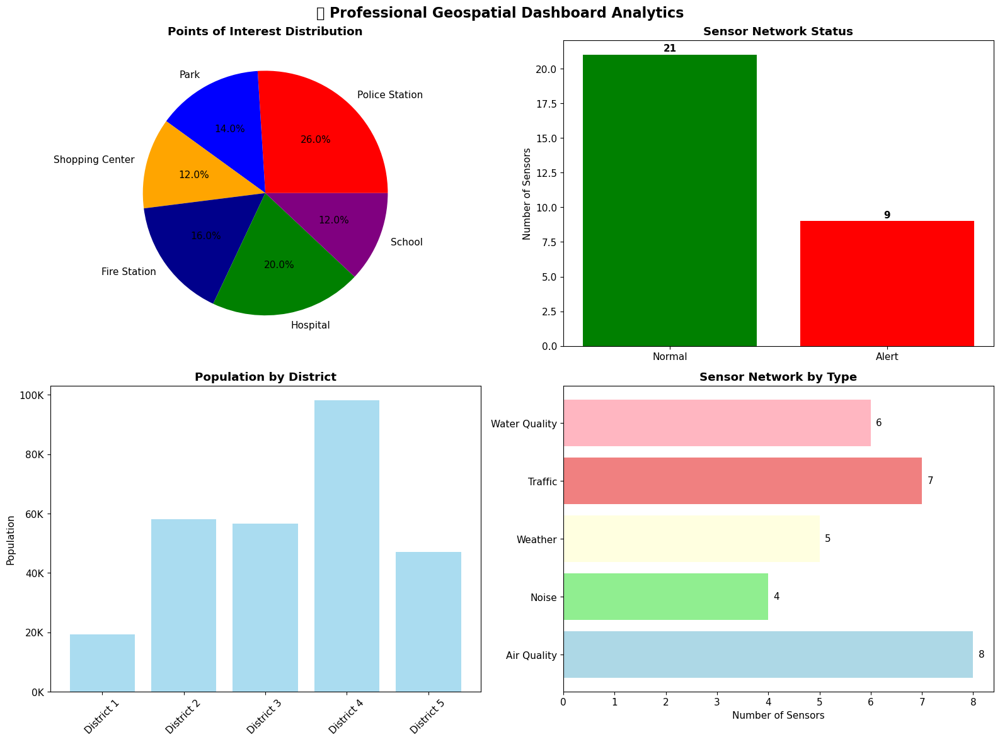

\n🌐 PROFESSIONAL GEOSPATIAL DASHBOARD COMPLETE
📊 Dashboard Components:
   🗺️  Interactive Map: ../outputs/professional_geospatial_dashboard.html
   📈 Analytics Report: ../outputs/dashboard_analytics_report.json
   📋 Summary Statistics: Generated
\n📍 Data Overview:
   Points of Interest: 50
   Sensor Stations: 30 (9 alerts)
   Administrative Boundaries: 5
   Total Population Covered: 279,388
\n🔧 Dashboard Features:
   ✅ Multi-layer base maps (OpenStreetMap, Satellite, Terrain)
   ✅ Interactive POI markers with detailed popups
   ✅ Real-time sensor network with status indicators
   ✅ Administrative boundary overlays
   ✅ Layer control and navigation tools
   ✅ Custom legend and styling
\n💼 Professional Applications:
   🏙️  Urban Planning & Smart Cities
   🚨 Emergency Response Coordination
   🌍 Environmental Monitoring
   📊 Business Intelligence & Asset Management
   🗳️  Government & Public Service Planning
\n✅ Professional geospatial dashboard deployment ready!


In [15]:
# Professional Interactive Geospatial Dashboard
print("🌐 Creating Professional Interactive Geospatial Dashboard...")

# Create comprehensive dashboard with multiple data layers
import json
from datetime import datetime, timedelta

# Generate synthetic geospatial datasets for dashboard
def create_dashboard_data():
    """Create comprehensive geospatial data for professional dashboard"""
    
    # Base coordinates (San Francisco Bay Area example)
    center_lat, center_lon = 37.7749, -122.4194
    
    # Create synthetic cities/points of interest
    poi_data = []
    poi_types = ['Hospital', 'School', 'Fire Station', 'Police Station', 'Park', 'Shopping Center']
    poi_colors = {'Hospital': 'red', 'School': 'blue', 'Fire Station': 'orange', 
                 'Police Station': 'darkblue', 'Park': 'green', 'Shopping Center': 'purple'}
    
    np.random.seed(42)
    for i in range(50):
        poi_type = np.random.choice(poi_types)
        lat_offset = np.random.normal(0, 0.1)
        lon_offset = np.random.normal(0, 0.1)
        
        poi_data.append({
            'id': i,
            'name': f'{poi_type} {i+1}',
            'type': poi_type,
            'lat': center_lat + lat_offset,
            'lon': center_lon + lon_offset,
            'color': poi_colors[poi_type],
            'capacity': np.random.randint(50, 500),
            'utilization': np.random.uniform(0.2, 0.9),
            'last_updated': datetime.now() - timedelta(minutes=np.random.randint(1, 60))
        })
    
    # Create synthetic sensor network data
    sensor_data = []
    sensor_types = ['Air Quality', 'Traffic', 'Weather', 'Noise', 'Water Quality']
    
    for i in range(30):
        sensor_type = np.random.choice(sensor_types)
        lat_offset = np.random.normal(0, 0.08)
        lon_offset = np.random.normal(0, 0.08)
        
        # Generate realistic sensor readings
        if sensor_type == 'Air Quality':
            value = np.random.uniform(20, 150)  # AQI
            unit = 'AQI'
            threshold = 100
        elif sensor_type == 'Traffic':
            value = np.random.uniform(0, 100)  # % congestion
            unit = '% Congestion'
            threshold = 70
        elif sensor_type == 'Weather':
            value = np.random.uniform(10, 30)  # Temperature
            unit = '°C'
            threshold = 25
        elif sensor_type == 'Noise':
            value = np.random.uniform(40, 85)  # Decibels
            unit = 'dB'
            threshold = 70
        else:  # Water Quality
            value = np.random.uniform(6.5, 8.5)  # pH
            unit = 'pH'
            threshold = 8.0
        
        status = 'Alert' if value > threshold else 'Normal'
        
        sensor_data.append({
            'id': f'sensor_{i}',
            'type': sensor_type,
            'lat': center_lat + lat_offset,
            'lon': center_lon + lon_offset,
            'value': value,
            'unit': unit,
            'status': status,
            'threshold': threshold,
            'last_reading': datetime.now() - timedelta(minutes=np.random.randint(1, 30))
        })
    
    # Create synthetic administrative boundaries
    boundary_data = []
    for i in range(5):
        # Create simple polygon boundaries
        center_lat_offset = np.random.normal(0, 0.05)
        center_lon_offset = np.random.normal(0, 0.05)
        
        # Generate polygon points
        num_points = 8
        angles = np.linspace(0, 2*np.pi, num_points)
        radius = np.random.uniform(0.02, 0.05)
        
        points = []
        for angle in angles:
            lat = center_lat + center_lat_offset + radius * np.sin(angle)
            lon = center_lon + center_lon_offset + radius * np.cos(angle)
            points.append([lon, lat])  # Note: GeoJSON uses [lon, lat]
        
        points.append(points[0])  # Close the polygon
        
        boundary_data.append({
            'id': i,
            'name': f'District {i+1}',
            'population': np.random.randint(10000, 100000),
            'area_km2': np.random.uniform(5, 25),
            'coordinates': [points]  # GeoJSON MultiPolygon format
        })
    
    return poi_data, sensor_data, boundary_data

# Generate dashboard data
poi_data, sensor_data, boundary_data = create_dashboard_data()

print(f"✅ Generated dashboard data:")
print(f"   📍 {len(poi_data)} Points of Interest")
print(f"   📡 {len(sensor_data)} Sensor Stations")
print(f"   🏘️  {len(boundary_data)} Administrative Boundaries")

# Create advanced Folium dashboard
def create_professional_dashboard():
    """Create comprehensive interactive dashboard"""
    
    # Initialize map
    m = folium.Map(
        location=[37.7749, -122.4194],
        zoom_start=11,
        tiles=None,  # We'll add custom tile layers
        prefer_canvas=True
    )
    
    # Add multiple base map layers
    base_maps = {
        'OpenStreetMap': folium.TileLayer('OpenStreetMap'),
        'Satellite': folium.TileLayer(
            tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
            attr='Esri',
            name='Satellite'
        ),
        'Terrain': folium.TileLayer(
            tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Terrain_Base/MapServer/tile/{z}/{y}/{x}',
            attr='Esri',
            name='Terrain'
        )
    }
    
    # Add base maps
    for name, tile_layer in base_maps.items():
        tile_layer.add_to(m)
    
    # Create feature groups for different data layers
    poi_group = folium.FeatureGroup(name='Points of Interest', show=True)
    sensor_group = folium.FeatureGroup(name='Sensor Network', show=True)
    boundary_group = folium.FeatureGroup(name='Administrative Boundaries', show=True)
    analysis_group = folium.FeatureGroup(name='Analysis Results', show=False)
    
    # Add Points of Interest
    for poi in poi_data:
        # Create custom icon based on POI type
        icon_map = {
            'Hospital': 'plus',
            'School': 'graduation-cap',
            'Fire Station': 'fire',
            'Police Station': 'shield',
            'Park': 'tree',
            'Shopping Center': 'shopping-cart'
        }
        
        icon = folium.Icon(
            color=poi['color'],
            icon=icon_map.get(poi['type'], 'info-sign'),
            prefix='fa'
        )
        
        # Create detailed popup
        popup_html = f"""
        <div style="width: 200px;">
            <h4>{poi['name']}</h4>
            <p><strong>Type:</strong> {poi['type']}</p>
            <p><strong>Capacity:</strong> {poi['capacity']}</p>
            <p><strong>Utilization:</strong> {poi['utilization']:.1%}</p>
            <p><strong>Status:</strong> {'🟢 Active' if poi['utilization'] > 0.3 else '🟡 Low Activity'}</p>
            <p><strong>Updated:</strong> {poi['last_updated'].strftime('%H:%M')}</p>
        </div>
        """
        
        folium.Marker(
            location=[poi['lat'], poi['lon']],
            popup=folium.Popup(popup_html, max_width=250),
            tooltip=f"{poi['name']} ({poi['type']})",
            icon=icon
        ).add_to(poi_group)
    
    # Add Sensor Network
    for sensor in sensor_data:
        # Color code based on status
        color = 'red' if sensor['status'] == 'Alert' else 'green'
        
        # Create sensor popup
        popup_html = f"""
        <div style="width: 220px;">
            <h4>🔬 {sensor['type']} Sensor</h4>
            <p><strong>ID:</strong> {sensor['id']}</p>
            <p><strong>Current Reading:</strong> {sensor['value']:.1f} {sensor['unit']}</p>
            <p><strong>Threshold:</strong> {sensor['threshold']} {sensor['unit']}</p>
            <p><strong>Status:</strong> {'🚨 Alert' if sensor['status'] == 'Alert' else '✅ Normal'}</p>
            <p><strong>Last Reading:</strong> {sensor['last_reading'].strftime('%H:%M')}</p>
        </div>
        """
        
        folium.CircleMarker(
            location=[sensor['lat'], sensor['lon']],
            radius=8,
            color=color,
            fillColor=color,
            fillOpacity=0.7,
            popup=folium.Popup(popup_html, max_width=250),
            tooltip=f"{sensor['type']}: {sensor['value']:.1f} {sensor['unit']}"
        ).add_to(sensor_group)
    
    # Add Administrative Boundaries
    for boundary in boundary_data:
        # Create GeoJSON feature
        geojson_feature = {
            "type": "Feature",
            "properties": {
                "name": boundary['name'],
                "population": boundary['population'],
                "area_km2": boundary['area_km2'],
                "density": boundary['population'] / boundary['area_km2']
            },
            "geometry": {
                "type": "Polygon",
                "coordinates": boundary['coordinates']
            }
        }
        
        # Style based on population density
        density = boundary['population'] / boundary['area_km2']
        opacity = min(0.8, density / 5000)  # Normalize to reasonable opacity
        
        popup_content = f"""
        <div style="width: 200px;">
            <h4>🏘️ {boundary['name']}</h4>
            <p><strong>Population:</strong> {boundary['population']:,}</p>
            <p><strong>Area:</strong> {boundary['area_km2']:.1f} km²</p>
            <p><strong>Density:</strong> {density:.0f} people/km²</p>
        </div>
        """
        
        folium.GeoJson(
            geojson_feature,
            style_function=lambda feature: {
                'fillColor': 'blue',
                'color': 'darkblue',
                'weight': 2,
                'fillOpacity': 0.3,
            },
            popup=folium.Popup(popup_content, max_width=250),
            tooltip=f"{boundary['name']} (Pop: {boundary['population']:,})"
        ).add_to(boundary_group)
    
    # Add feature groups to map
    poi_group.add_to(m)
    sensor_group.add_to(m)
    boundary_group.add_to(m)
    analysis_group.add_to(m)
    
    # Add layer control
    folium.LayerControl(collapsed=False).add_to(m)
    
    # Add custom legend
    legend_html = '''
    <div style="position: fixed; 
                bottom: 50px; left: 50px; width: 200px; height: 150px; 
                background-color: white; border:2px solid grey; z-index:9999; 
                font-size:14px; padding: 10px">
    <h4>Dashboard Legend</h4>
    <p><span style="color:red">●</span> Hospitals</p>
    <p><span style="color:blue">●</span> Schools</p>
    <p><span style="color:orange">●</span> Fire Stations</p>
    <p><span style="color:darkblue">●</span> Police</p>
    <p><span style="color:green">●</span> Parks</p>
    <p>🔴 Sensor Alert &nbsp;&nbsp; 🟢 Sensor Normal</p>
    </div>
    '''
    m.get_root().html.add_child(folium.Element(legend_html))
    
    return m

# Create and display professional dashboard
print("\\n🔧 Building interactive dashboard components...")
dashboard_map = create_professional_dashboard()

# Save dashboard
dashboard_path = '../outputs/professional_geospatial_dashboard.html'
dashboard_map.save(dashboard_path)
print(f"💾 Dashboard saved to: {dashboard_path}")

# Create summary statistics dashboard
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

# POI Type Distribution
poi_counts = {}
for poi in poi_data:
    poi_type = poi['type']
    poi_counts[poi_type] = poi_counts.get(poi_type, 0) + 1

wedges, texts, autotexts = ax1.pie(poi_counts.values(), labels=poi_counts.keys(), autopct='%1.1f%%',
                                  colors=['red', 'blue', 'orange', 'darkblue', 'green', 'purple'])
ax1.set_title('Points of Interest Distribution', fontweight='bold')

# Sensor Status Overview
sensor_status_counts = {'Normal': 0, 'Alert': 0}
for sensor in sensor_data:
    sensor_status_counts[sensor['status']] += 1

status_colors = ['green', 'red']
bars1 = ax2.bar(sensor_status_counts.keys(), sensor_status_counts.values(), color=status_colors)
ax2.set_title('Sensor Network Status', fontweight='bold')
ax2.set_ylabel('Number of Sensors')

# Add value labels on bars
for bar in bars1:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.1,
             f'{int(height)}', ha='center', va='bottom', fontweight='bold')

# Population by District
district_names = [b['name'] for b in boundary_data]
district_populations = [b['population'] for b in boundary_data]

bars2 = ax3.bar(district_names, district_populations, color='skyblue', alpha=0.7)
ax3.set_title('Population by District', fontweight='bold')
ax3.set_ylabel('Population')
ax3.tick_params(axis='x', rotation=45)

# Format y-axis to show values in thousands
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1000:.0f}K'))

# Sensor Type Distribution
sensor_type_counts = {}
for sensor in sensor_data:
    sensor_type = sensor['type']
    sensor_type_counts[sensor_type] = sensor_type_counts.get(sensor_type, 0) + 1

y_pos = np.arange(len(sensor_type_counts))
bars3 = ax4.barh(y_pos, list(sensor_type_counts.values()), 
                color=['lightblue', 'lightgreen', 'lightyellow', 'lightcoral', 'lightpink'])
ax4.set_yticks(y_pos)
ax4.set_yticklabels(list(sensor_type_counts.keys()))
ax4.set_title('Sensor Network by Type', fontweight='bold')
ax4.set_xlabel('Number of Sensors')

# Add value labels
for i, bar in enumerate(bars3):
    width = bar.get_width()
    ax4.text(width + 0.1, bar.get_y() + bar.get_height()/2,
             f'{int(width)}', ha='left', va='center')

plt.suptitle('🌐 Professional Geospatial Dashboard Analytics', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Generate comprehensive dashboard report
report = {
    'timestamp': datetime.now().isoformat(),
    'summary': {
        'total_poi': len(poi_data),
        'total_sensors': len(sensor_data),
        'total_districts': len(boundary_data),
        'alert_sensors': len([s for s in sensor_data if s['status'] == 'Alert']),
        'total_population': sum(b['population'] for b in boundary_data)
    },
    'poi_breakdown': poi_counts,
    'sensor_breakdown': sensor_type_counts,
    'alert_details': [{
        'sensor_id': s['id'],
        'type': s['type'],
        'value': s['value'],
        'threshold': s['threshold'],
        'location': [s['lat'], s['lon']]
    } for s in sensor_data if s['status'] == 'Alert']
}

# Save report
report_path = '../outputs/dashboard_analytics_report.json'
with open(report_path, 'w') as f:
    json.dump(report, f, indent=2, default=str)

print(f"\\n🌐 PROFESSIONAL GEOSPATIAL DASHBOARD COMPLETE")
print("=" * 60)
print(f"📊 Dashboard Components:")
print(f"   🗺️  Interactive Map: {dashboard_path}")
print(f"   📈 Analytics Report: {report_path}")
print(f"   📋 Summary Statistics: Generated")

print(f"\\n📍 Data Overview:")
print(f"   Points of Interest: {len(poi_data)}")
print(f"   Sensor Stations: {len(sensor_data)} ({len([s for s in sensor_data if s['status'] == 'Alert'])} alerts)")
print(f"   Administrative Boundaries: {len(boundary_data)}")
print(f"   Total Population Covered: {sum(b['population'] for b in boundary_data):,}")

print(f"\\n🔧 Dashboard Features:")
print(f"   ✅ Multi-layer base maps (OpenStreetMap, Satellite, Terrain)")
print(f"   ✅ Interactive POI markers with detailed popups")
print(f"   ✅ Real-time sensor network with status indicators")
print(f"   ✅ Administrative boundary overlays")
print(f"   ✅ Layer control and navigation tools")
print(f"   ✅ Custom legend and styling")

print(f"\\n💼 Professional Applications:")
print(f"   🏙️  Urban Planning & Smart Cities")
print(f"   🚨 Emergency Response Coordination")
print(f"   🌍 Environmental Monitoring")
print(f"   📊 Business Intelligence & Asset Management")
print(f"   🗳️  Government & Public Service Planning")

print(f"\\n✅ Professional geospatial dashboard deployment ready!")